<h1>How does energy demand correlate with climate change, and how can we produce more
energy without increasing pollution?<h1>

In [108]:
import pandas as pd
import numpy as np
# Replace 'data/data.csv' with the path to your file
file_path = '/Users/niloyshowrav/Downloads/nsu/Research/q1/complete_renewable_energy_dataset .csv'
df = pd.read_csv(file_path)

print(df.head())  # Display the first few rows


     Country  Year Energy Type  Production (GWh)  Installed Capacity (MW)  \
0        USA  2011       Solar      85404.690027              5549.794323   
1  Australia  2008  Geothermal      22205.069382             43211.593798   
2     Canada  2013     Biomass      94102.732038              6139.117212   
3      Japan  2010     Biomass      88771.932910             40323.639260   
4      China  2018       Solar      93288.408581             30755.403056   

   Investments (USD)  Population           GDP  Energy Consumption  \
0       5.604125e+09  1064007213  1.775278e+14       369654.644184   
1       6.361886e+08  1033255852  6.435372e+13       771781.636293   
2       6.158680e+09    14895124  1.567926e+14       342707.152899   
3       8.526116e+09  1448827283  1.350464e+14       498839.574253   
4       5.086237e+09  1499494307  8.677956e+13       819064.362785   

   Energy Exports  ...  Economic Freedom Index  Ease of Doing Business  \
0    93087.198199  ...               49.21

In [109]:
column_names = df.columns.tolist()
print(column_names)


['Country', 'Year', 'Energy Type', 'Production (GWh)', 'Installed Capacity (MW)', 'Investments (USD)', 'Population', 'GDP', 'Energy Consumption', 'Energy Exports', 'Energy Imports', 'CO2 Emissions', 'Renewable Energy Jobs', 'Government Policies', 'R&D Expenditure', 'Renewable Energy Targets', 'Average Annual Temperature', 'Annual Rainfall', 'Solar Irradiance', 'Wind Speed', 'Hydro Potential', 'Geothermal Potential', 'Biomass Availability', 'Energy Storage Capacity', 'Grid Integration Capability', 'Electricity Prices', 'Energy Subsidies', 'International Aid for Renewables', 'Public Awareness', 'Energy Efficiency Programs', 'Urbanization Rate', 'Industrialization Rate', 'Energy Market Liberalization', 'Renewable Energy Patents', 'Educational Level', 'Technology Transfer Agreements', 'Renewable Energy Education Programs', 'Local Manufacturing Capacity', 'Import Tariffs on Energy Equipment', 'Export Incentives for Energy Equipment', 'Natural Disasters', 'Political Stability', 'Corruption P

In [110]:

print("Dataset Information:")
print(df.info())

# Check for missing values
print("\nMissing Values:")
print(df.isnull().sum())

# Handle missing values
# For numerical columns, fill missing values with the median
numerical_cols = df.select_dtypes(include=[np.number]).columns
df[numerical_cols] = df[numerical_cols].fillna(df[numerical_cols].median())

# For categorical columns, fill missing values with 'Unknown'
categorical_cols = df.select_dtypes(include=['object']).columns
df[categorical_cols] = df[categorical_cols].fillna('Unknown')

# Check for duplicate rows
duplicates = df.duplicated().sum()
print("\nNumber of duplicate rows:", duplicates)

# Remove duplicate rows if any
energy_data = df.drop_duplicates()


energy_data['Year'] = pd.to_datetime(energy_data['Year'], format='%Y')

Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 56 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Country                                  2500 non-null   object 
 1   Year                                     2500 non-null   int64  
 2   Energy Type                              2500 non-null   object 
 3   Production (GWh)                         2500 non-null   float64
 4   Installed Capacity (MW)                  2500 non-null   float64
 5   Investments (USD)                        2500 non-null   float64
 6   Population                               2500 non-null   int64  
 7   GDP                                      2500 non-null   float64
 8   Energy Consumption                       2500 non-null   float64
 9   Energy Exports                           2500 non-null   float64
 10  Energy Imports             

<h1>Understand and Analyze the Correlation:</h1>

<h4>Energy Demand Trends<h4>

Correlation Matrix:
                        Energy Consumption  Population  Urbanization Rate  \
Energy Consumption                1.000000   -0.005867          -0.032606   
Population                       -0.005867    1.000000          -0.000537   
Urbanization Rate                -0.032606   -0.000537           1.000000   
Industrialization Rate            0.011247    0.019710           0.004469   

                        Industrialization Rate  
Energy Consumption                    0.011247  
Population                            0.019710  
Urbanization Rate                     0.004469  
Industrialization Rate                1.000000  


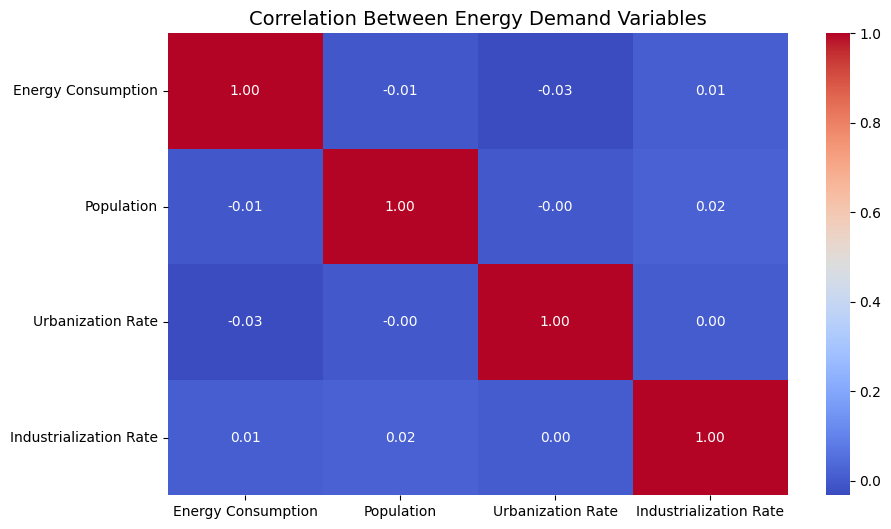

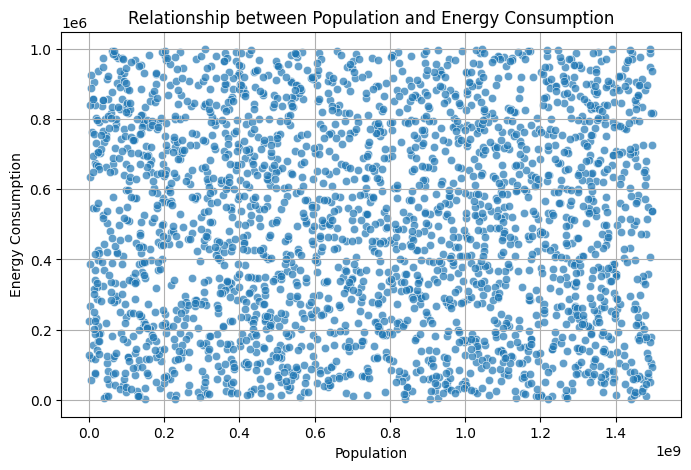

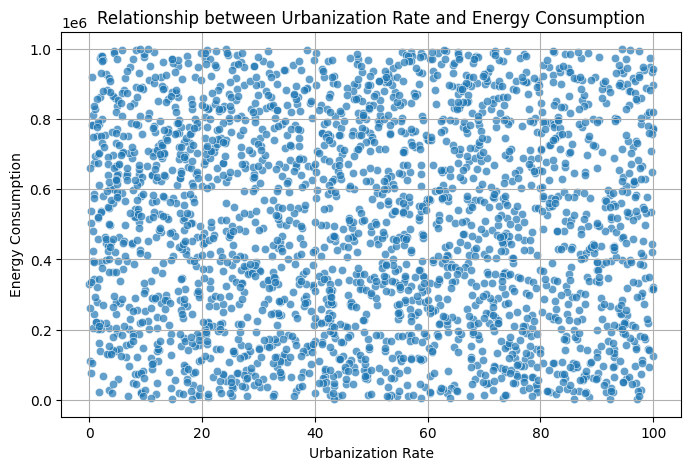

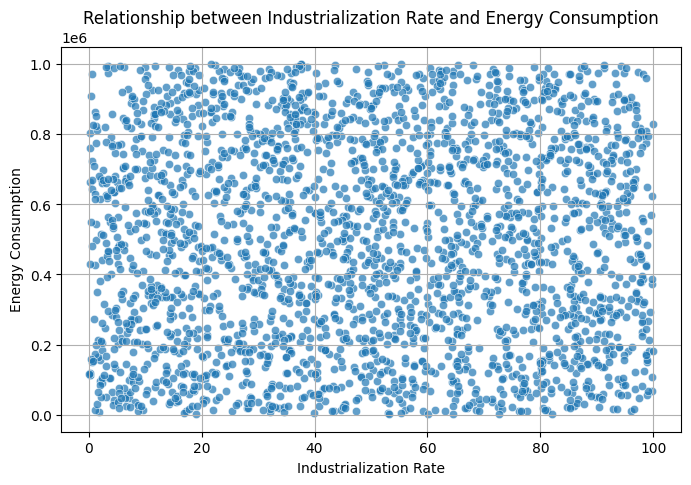


Mean Squared Error: 94660725786.03
R-squared Score: -0.11


/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_60305/573749193.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=feature_importance, palette='viridis')


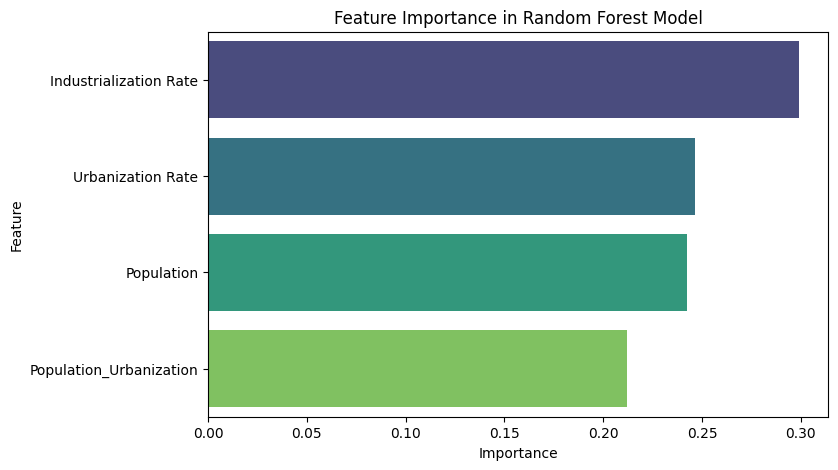

In [111]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Step 1: Data Cleaning
# Convert numeric columns and handle missing values
numeric_columns = ['Energy Consumption', 'Population', 'Urbanization Rate', 'Industrialization Rate']
df[numeric_columns] = df[numeric_columns].apply(pd.to_numeric, errors='coerce')  # Ensure all are numeric
df.dropna(subset=numeric_columns, inplace=True)  # Drop rows with missing values

# Step 2: Correlation Analysis
correlation_matrix = df[numeric_columns].corr()
print("Correlation Matrix:")
print(correlation_matrix)

plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Between Energy Demand Variables', fontsize=14)
plt.show()

# Step 3: Visualize Relationships
variables = ['Population', 'Urbanization Rate', 'Industrialization Rate']
for var in variables:
    plt.figure(figsize=(8, 5))
    sns.scatterplot(x=var, y='Energy Consumption', data=df, alpha=0.7)
    plt.title(f'Relationship between {var} and Energy Consumption')
    plt.xlabel(var)
    plt.ylabel('Energy Consumption')
    plt.grid()
    plt.show()

# Step 4: Feature Engineering
df['Population_Urbanization'] = df['Population'] * df['Urbanization Rate']
df['Log_Energy_Consumption'] = np.log1p(df['Energy Consumption'])  # Log transformation

# Step 5: Model Building - Random Forest
# Features and target
features = ['Population', 'Urbanization Rate', 'Industrialization Rate', 'Population_Urbanization']
target = 'Energy Consumption'

# Prepare data
X = df[features]
y = df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predictions
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"\nMean Squared Error: {mse:.2f}")
print(f"R-squared Score: {r2:.2f}")

# Step 6: Feature Importance
importances = rf_model.feature_importances_
feature_importance = pd.DataFrame({'Feature': features, 'Importance': importances})
feature_importance = feature_importance.sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(8, 5))
sns.barplot(x='Importance', y='Feature', data=feature_importance, palette='viridis')
plt.title('Feature Importance in Random Forest Model')
plt.show()


 Link to Climate Indicators


Correlation Matrix - Energy Consumption and Climate Indicators:

                            Energy Consumption  CO2 Emissions  \
Energy Consumption                    1.000000       0.026668   
CO2 Emissions                         0.026668       1.000000   
Average Annual Temperature            0.001997      -0.007303   
Annual Rainfall                      -0.011158       0.017240   

                            Average Annual Temperature  Annual Rainfall  
Energy Consumption                            0.001997        -0.011158  
CO2 Emissions                                -0.007303         0.017240  
Average Annual Temperature                    1.000000        -0.003701  
Annual Rainfall                              -0.003701         1.000000  


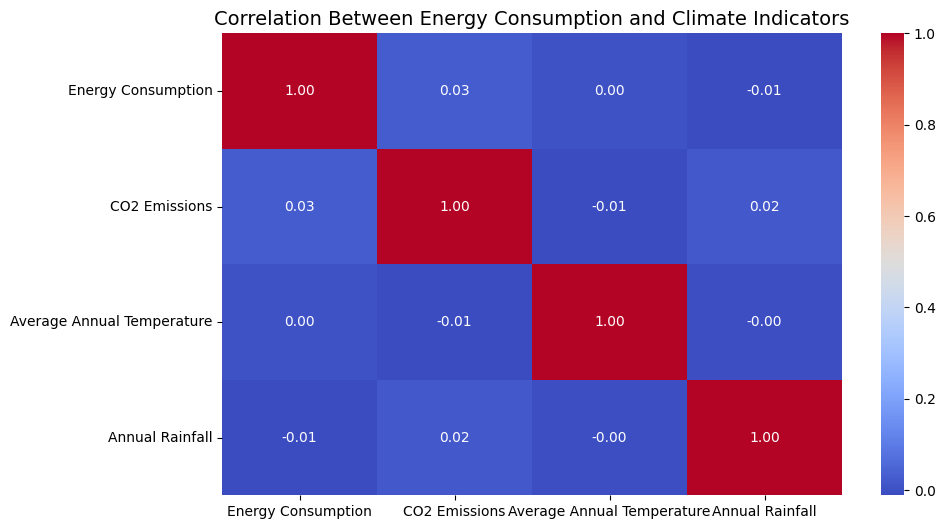

In [112]:
# Step 3: Link to Climate Indicators
# Correlation matrix for energy consumption and climate indicators
climate_vars = ['Energy Consumption', 'CO2 Emissions', 'Average Annual Temperature', 'Annual Rainfall']
correlation_matrix_climate = df[climate_vars].corr()

# Print the correlation matrix values
print("Correlation Matrix - Energy Consumption and Climate Indicators:\n")
print(correlation_matrix_climate)

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix_climate, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Between Energy Consumption and Climate Indicators', fontsize=14)
plt.show()


Seasonal and Geographical Variation


Correlation Matrix - Renewable Energy Potential Variables:

                      Solar Irradiance  Wind Speed  Hydro Potential  \
Solar Irradiance              1.000000   -0.004756         0.037341   
Wind Speed                   -0.004756    1.000000        -0.001427   
Hydro Potential               0.037341   -0.001427         1.000000   
Geothermal Potential          0.004418    0.004656        -0.017591   
Biomass Availability          0.006875    0.034195         0.013472   

                      Geothermal Potential  Biomass Availability  
Solar Irradiance                  0.004418              0.006875  
Wind Speed                        0.004656              0.034195  
Hydro Potential                  -0.017591              0.013472  
Geothermal Potential              1.000000             -0.015483  
Biomass Availability             -0.015483              1.000000  


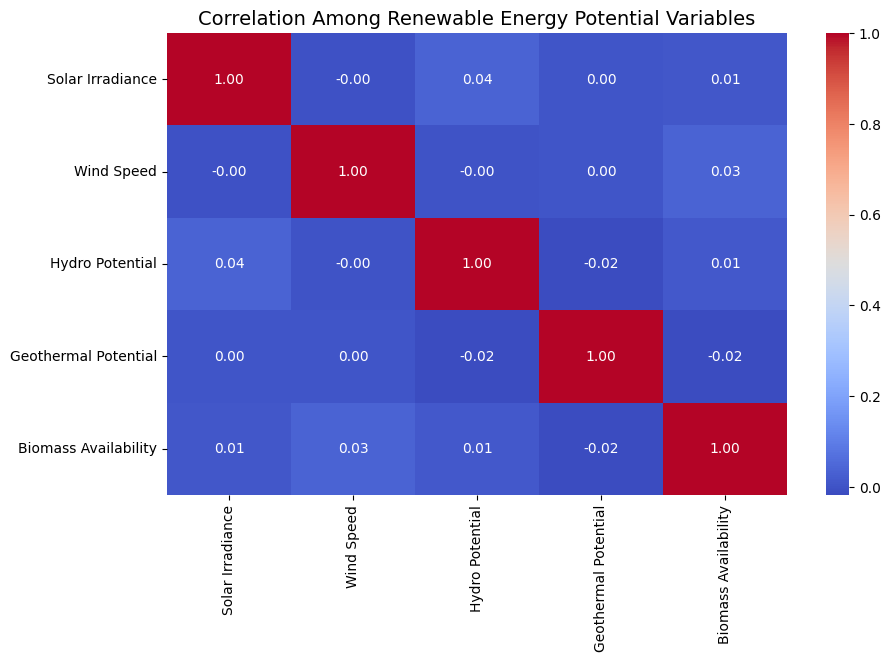


Time-Series Data - Average Energy Consumption by Year:

Year
2000    524717.541176
2001    526361.113091
2002    483165.704716
2003    499874.522053
2004    505249.767221
2005    512371.770851
2006    470013.719817
2007    501882.274796
2008    513637.529750
2009    463450.442366
2010    490997.432285
2011    477572.873612
2012    482414.349955
2013    496255.308841
2014    483216.858625
2015    458809.537966
2016    511716.423704
2017    436898.463060
2018    551647.473718
2019    471273.395646
2020    485324.485287
2021    507858.418365
2022    505188.132354
2023    510699.001378
Name: Energy Consumption, dtype: float64


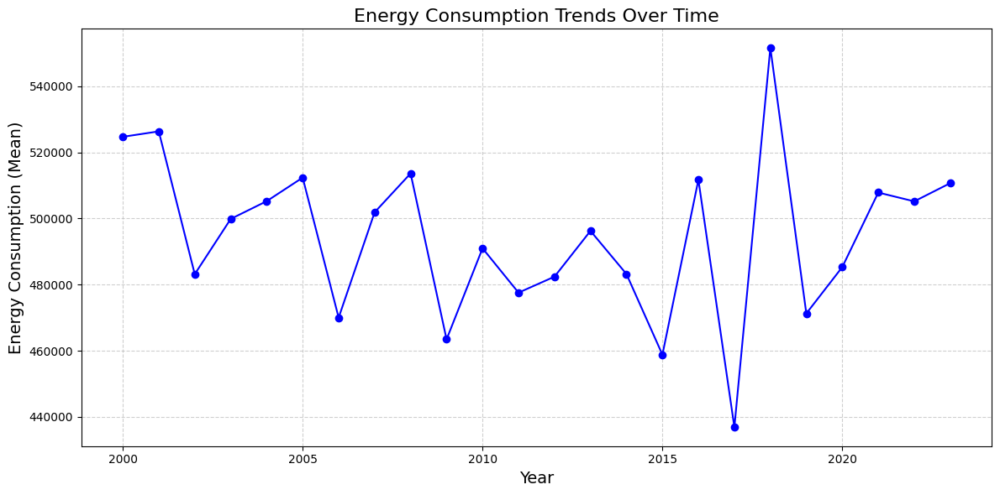

In [113]:
# Step 4: Seasonal and Geographical Variations
# Correlation matrix for renewable energy potential variables
renewable_vars = ['Solar Irradiance', 'Wind Speed', 'Hydro Potential', 'Geothermal Potential', 'Biomass Availability']
correlation_matrix_renewables = df[renewable_vars].corr()

# Print the correlation matrix for renewable energy potential variables
print("Correlation Matrix - Renewable Energy Potential Variables:\n")
print(correlation_matrix_renewables)

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix_renewables, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Among Renewable Energy Potential Variables', fontsize=14)
plt.show()

# Step 5: Time-Series Analysis of Energy Consumption
df['Year'] = pd.to_numeric(df['Year'], errors='coerce')  # Ensure 'Year' is numeric
df = df[df['Year'] > 1970]  # Focus on modern data
time_series_data = df.groupby('Year')['Energy Consumption'].mean()

# Print the time-series data
print("\nTime-Series Data - Average Energy Consumption by Year:\n")
print(time_series_data)

# Plot the time-series data
plt.figure(figsize=(12, 6))
time_series_data.plot(marker='o', color='blue')
plt.title('Energy Consumption Trends Over Time', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Energy Consumption (Mean)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


<h1> Promote renewable energy sources<h1>

	Identify High-Potential Renewables:


High Potential Renewable Energy Sources by Average Potential:

             Solar Irradiance  Wind Speed  Hydro Potential  \
Energy Type                                                  
Wind               200.688850    7.561030        50.757653   
Solar              203.432915    7.610797        50.339558   
Hydro              199.233325    7.258251        49.729972   
Geothermal         198.970141    7.675096        49.980165   
Biomass            199.477321    7.311748        48.669130   

             Geothermal Potential  Biomass Availability  Average Potential  
Energy Type                                                                 
Wind                    51.713229             49.317772          72.007707  
Solar                   48.600966             49.495268          71.895901  
Hydro                   51.421086             51.645829          71.857693  
Geothermal              48.146626             50.012201          70.956846  
Biomass                 49.807457       

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_60305/314611914.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


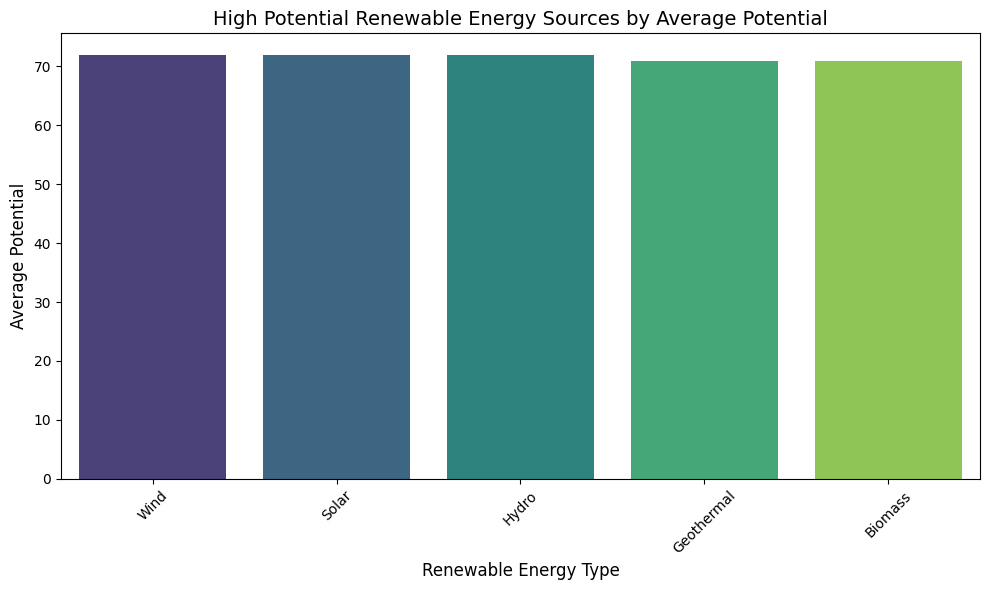

In [114]:
# Step 1: Filter columns of interest for renewable energy potentials
renewable_columns = ['Solar Irradiance', 'Wind Speed', 'Hydro Potential', 'Geothermal Potential',
                     'Biomass Availability', 'Energy Type']

# Create a new DataFrame with the relevant columns, ensuring no SettingWithCopyWarning
renewables_data = df[renewable_columns].copy()

# Step 2: Calculate an index to prioritize renewable energy potentials
# Compute the average renewable potential for each row
renewables_data['Average Potential'] = renewables_data[['Solar Irradiance', 'Wind Speed',
                                                       'Hydro Potential', 'Geothermal Potential',
                                                       'Biomass Availability']].mean(axis=1)

# Step 3: Group by 'Energy Type' and compute the mean of the renewable potentials
# Sort the values based on the 'Average Potential'
high_potential_renewables = (
    renewables_data.groupby('Energy Type')
    .mean()
    .sort_values(by='Average Potential', ascending=False)
)

# Print the high-potential renewables data
print("High Potential Renewable Energy Sources by Average Potential:\n")
print(high_potential_renewables)

# Step 4: Visualize the high-potential renewable energy sources
plt.figure(figsize=(10, 6))
sns.barplot(
    x=high_potential_renewables.index,
    y=high_potential_renewables['Average Potential'],
    palette='viridis',
    hue=None  # Fix for the deprecation warning
)
plt.title('High Potential Renewable Energy Sources by Average Potential', fontsize=14)
plt.xlabel('Renewable Energy Type', fontsize=12)
plt.ylabel('Average Potential', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Filtered Renewable Energy Data (Sample):

     Country  Year Energy Type  Production (GWh)  Installed Capacity (MW)  \
0        USA  2011       Solar      85404.690027              5549.794323   
1  Australia  2008  Geothermal      22205.069382             43211.593798   
2     Canada  2013     Biomass      94102.732038              6139.117212   
3      Japan  2010     Biomass      88771.932910             40323.639260   
4      China  2018       Solar      93288.408581             30755.403056   

   Investments (USD)  Population           GDP  Energy Consumption  \
0       5.604125e+09  1064007213  1.775278e+14       369654.644184   
1       6.361886e+08  1033255852  6.435372e+13       771781.636293   
2       6.158680e+09    14895124  1.567926e+14       342707.152899   
3       8.526116e+09  1448827283  1.350464e+14       498839.574253   
4       5.086237e+09  1499494307  8.677956e+13       819064.362785   

   Energy Exports  ...  Innovation Index  Number of Research Institutions 

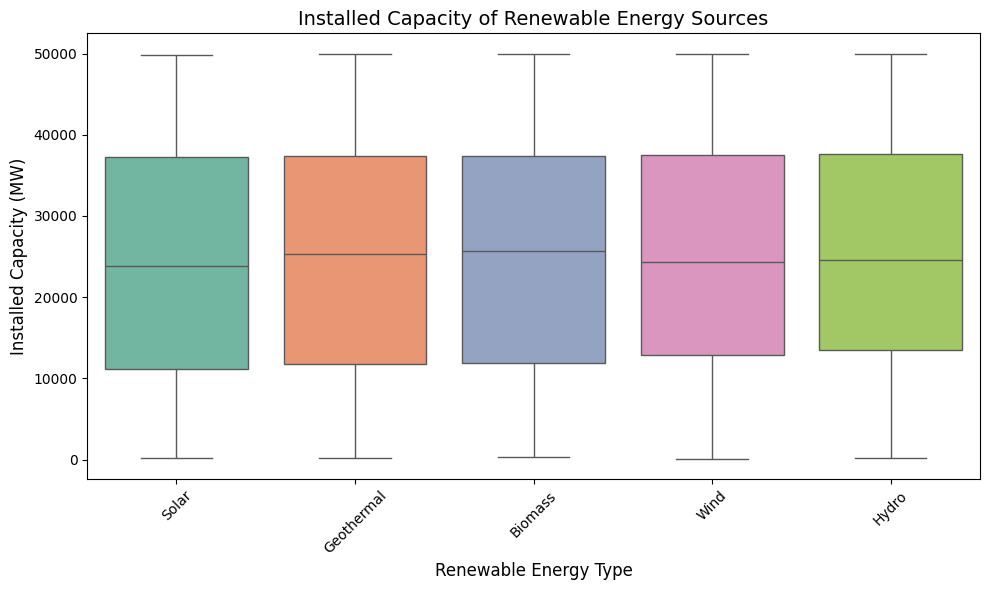


Countries with Underutilized Renewable Capacity:

Country
Canada       5.436372e+06
USA          5.554253e+06
Russia       5.748276e+06
Brazil       6.148688e+06
Germany      6.185972e+06
Australia    6.259945e+06
Japan        6.274709e+06
China        6.397026e+06
India        6.492807e+06
France       7.709229e+06
Name: Installed Capacity (MW), dtype: float64


/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_60305/3282280696.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=underutilized_renewables.index[:10], y=underutilized_renewables.values[:10],


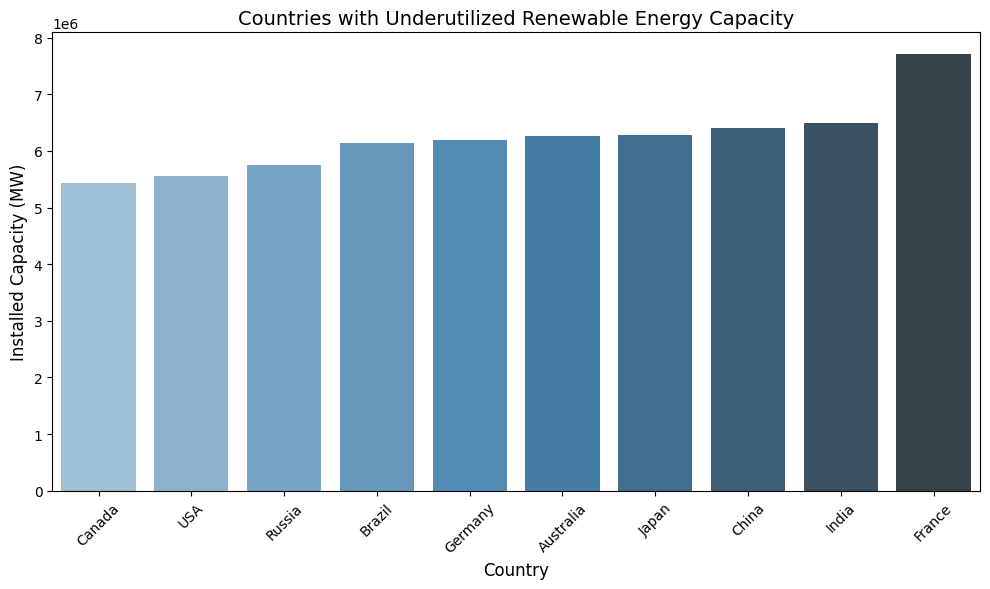

In [115]:
# Step 1: Filter renewable energies based on installed capacity (MW)
# Filter for relevant renewable energy types
renewables_capacity = df[df['Energy Type'].isin(['Solar', 'Wind', 'Hydro', 'Geothermal', 'Biomass'])]

# Print the filtered data
print("Filtered Renewable Energy Data (Sample):\n")
print(renewables_capacity.head())

# Step 2: Visualize installed capacity for renewables by energy type
plt.figure(figsize=(10, 6))
sns.boxplot(x='Energy Type', y='Installed Capacity (MW)', data=renewables_capacity,
            hue='Energy Type', palette='Set2')
plt.title('Installed Capacity of Renewable Energy Sources', fontsize=14)
plt.xlabel('Renewable Energy Type', fontsize=12)
plt.ylabel('Installed Capacity (MW)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Step 3: Identify countries with underutilized renewable capacity
# Group by 'Country' and sum up installed capacity (MW)
underutilized_renewables = renewables_capacity.groupby('Country')['Installed Capacity (MW)'].sum().sort_values()

# Print the countries with underutilized renewable capacity
print("\nCountries with Underutilized Renewable Capacity:\n")
print(underutilized_renewables.head(10))

# Step 4: Visualize underutilized countries
plt.figure(figsize=(10, 6))
sns.barplot(x=underutilized_renewables.index[:10], y=underutilized_renewables.values[:10],
            palette='Blues_d')
plt.title('Countries with Underutilized Renewable Energy Capacity', fontsize=14)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Installed Capacity (MW)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<h1> Invest in Clean Tehnologies

R&D Expenditure Data (Sample):

     Country  R&D Expenditure  Renewable Energy Patents
0        USA     8.676561e+09                       423
1  Australia     4.421452e+09                       519
2     Canada     8.568534e+09                       215
3      Japan     9.958631e+09                        73
4      China     7.608112e+09                       859


/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_60305/2502007182.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Country', y='R&D Expenditure', data=rd_data, palette='viridis')


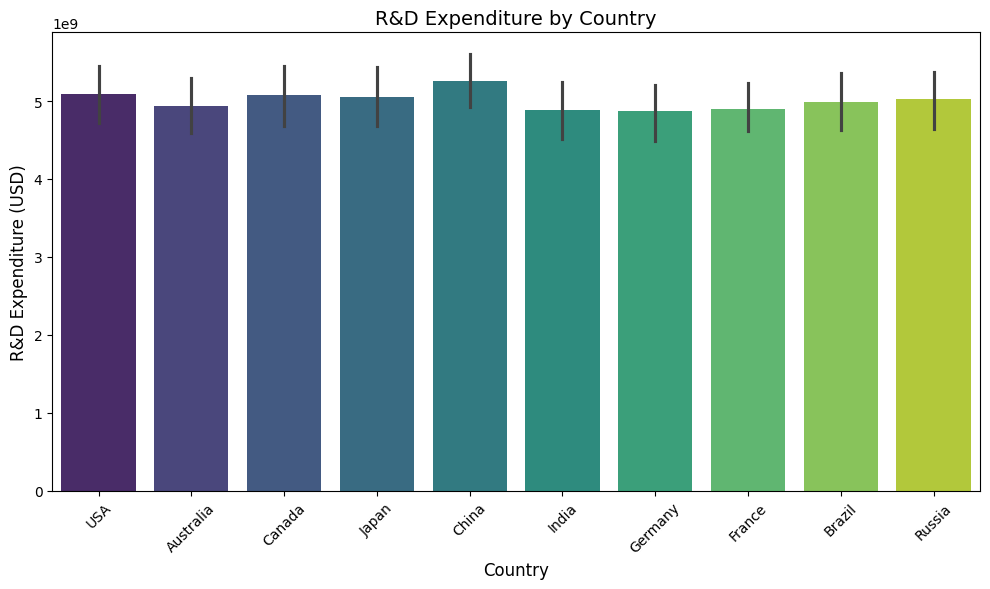


CO2 Emissions and Public-Private Partnerships Data (Sample):

     Country  CO2 Emissions  Public-Private Partnerships in Energy
0        USA  294399.377891                                      1
1  Australia  826531.678252                                      0
2     Canada   43695.240191                                      1
3      Japan  840378.796682                                      0
4      China  162034.254340                                      1


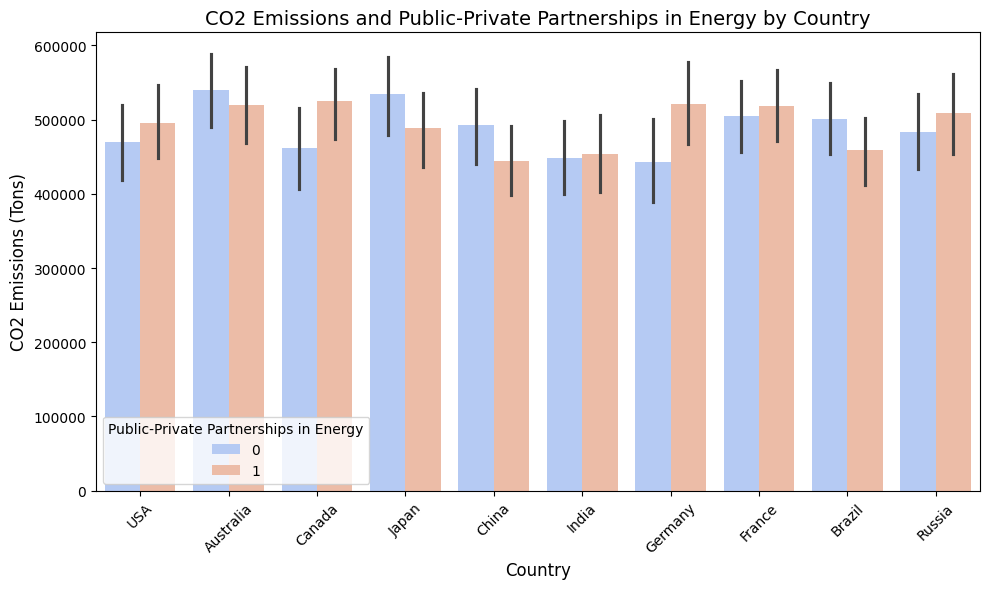


Public-Private Partnerships and Investments Data (Sample):

     Country  Public-Private Partnerships in Energy  Investments (USD)
0        USA                                      1       5.604125e+09
1  Australia                                      0       6.361886e+08
2     Canada                                      1       6.158680e+09
3      Japan                                      0       8.526116e+09
4      China                                      1       5.086237e+09


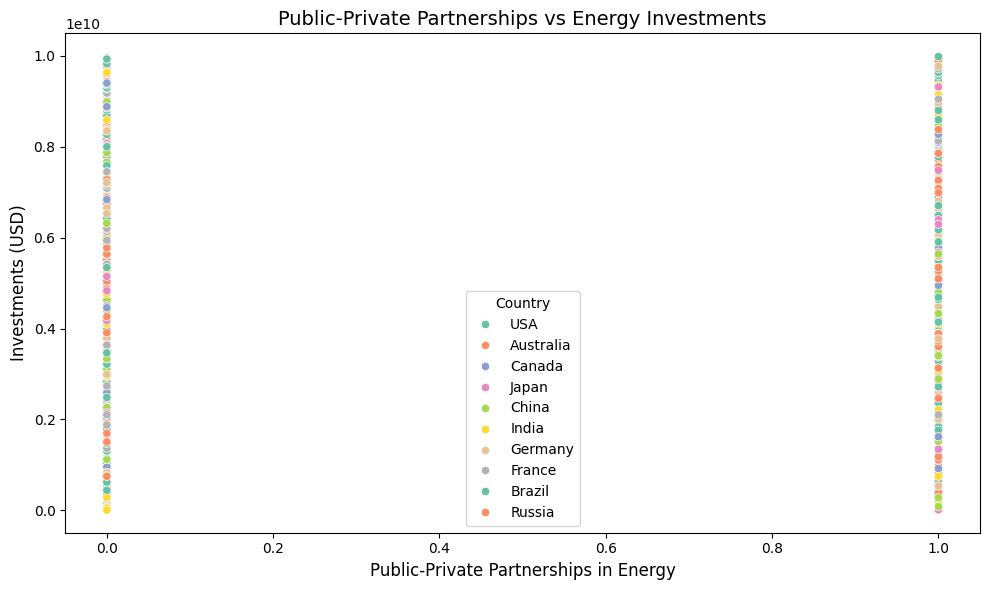


Effectiveness of PPPs in Energy Consumption:

           Investments (USD)  Renewable Energy Patents  Energy Consumption
Country                                                                   
France          1.472550e+12                    158576        1.473137e+08
Japan           1.256971e+12                    126143        1.359669e+08
India           1.312304e+12                    117917        1.269759e+08
China           1.218560e+12                    132403        1.251342e+08
Russia          1.170506e+12                    121462        1.222343e+08
Canada          1.131853e+12                    111034        1.184600e+08
USA             1.230604e+12                    118989        1.164388e+08
Brazil          1.204817e+12                    112241        1.162348e+08
Germany         1.182205e+12                    116351        1.154598e+08
Australia       1.210016e+12                    124393        1.150346e+08


/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_60305/2502007182.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ppp_effectiveness.index, y=ppp_effectiveness['Energy Consumption'], palette='Blues')


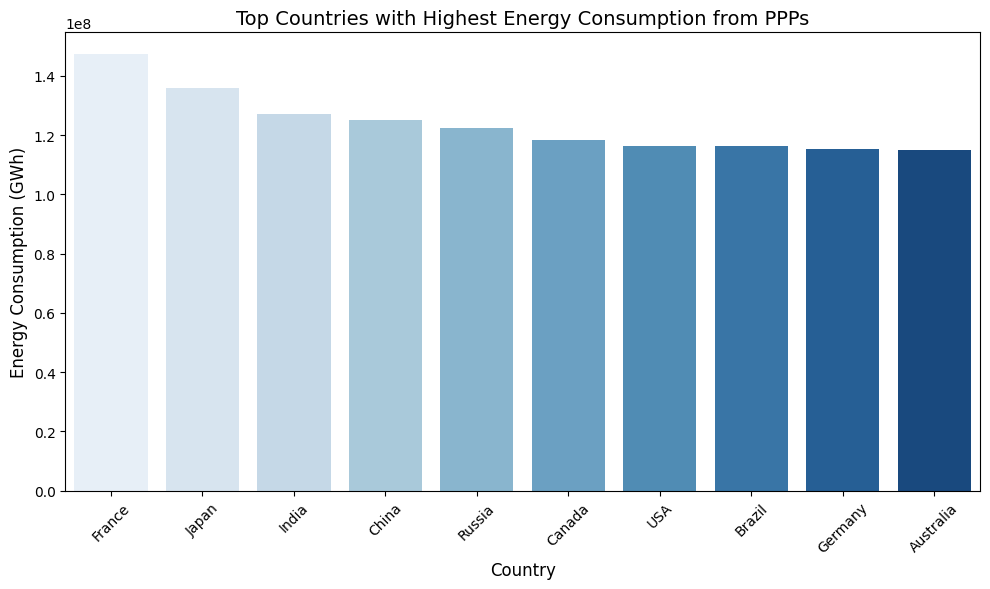


Correlation Matrix:

                          R&D Expenditure  Renewable Energy Patents  \
R&D Expenditure                  1.000000                  0.026818   
Renewable Energy Patents         0.026818                  1.000000   
Energy Consumption              -0.006994                 -0.027585   

                          Energy Consumption  
R&D Expenditure                    -0.006994  
Renewable Energy Patents           -0.027585  
Energy Consumption                  1.000000  


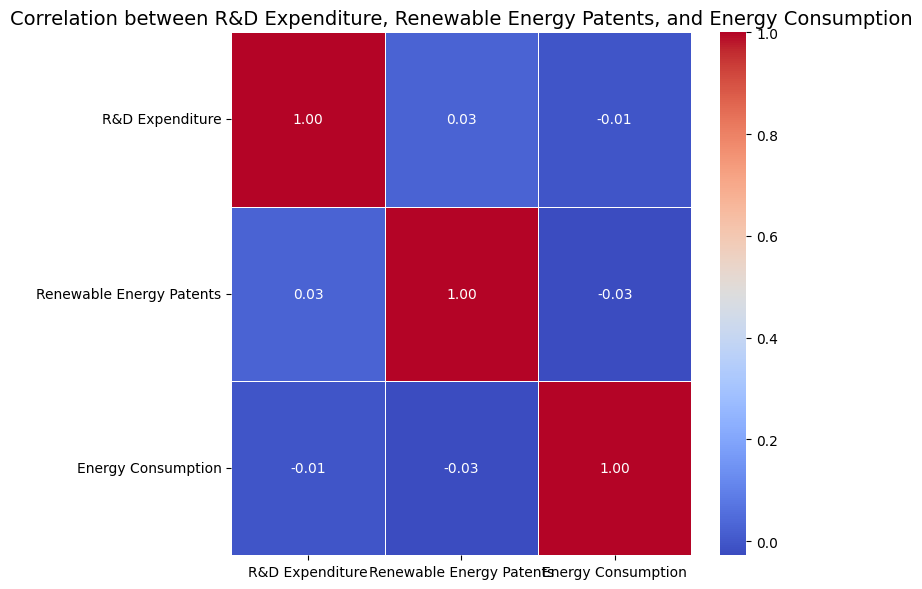


Clean Technology Scores (Sample):

     Country  Clean Technology Score
0        USA            3.470736e+09
1  Australia            1.768812e+09
2     Canada            3.427517e+09
3      Japan            3.983602e+09
4      China            3.043491e+09

Top Countries Leading in Clean Technologies:

        Country  Clean Technology Score
1069      India            3.999436e+09
1812  Australia            3.998268e+09
347      Russia            3.998061e+09
1546        USA            3.996849e+09
2029      Japan            3.996353e+09
1501      China            3.992054e+09
206      Canada            3.991424e+09
1445    Germany            3.987633e+09
1981  Australia            3.987117e+09
1297      India            3.986692e+09


/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_60305/2502007182.py:108: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_countries['Country'], y=top_countries['Clean Technology Score'], palette='viridis')


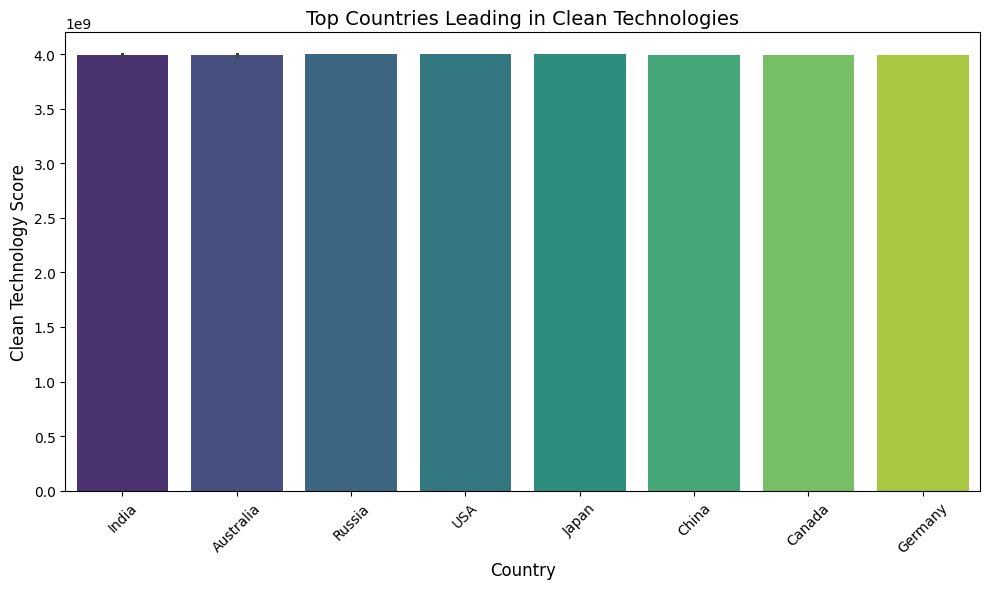

In [116]:
# Fix column names by stripping extra spaces
df.columns = df.columns.str.strip()

# Step 1: Visualize R&D Expenditure vs Renewable Energy Patents by Country
rd_data = df[['Country', 'R&D Expenditure', 'Renewable Energy Patents']]

# Print R&D Expenditure data
print("R&D Expenditure Data (Sample):\n")
print(rd_data.head())

# Bar plot for R&D Expenditure by Country
plt.figure(figsize=(10, 6))
sns.barplot(x='Country', y='R&D Expenditure', data=rd_data, palette='viridis')
plt.title('R&D Expenditure by Country', fontsize=14)
plt.xlabel('Country', fontsize=12)
plt.ylabel('R&D Expenditure (USD)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Step 2: Analyze CO2 Emissions vs Public-Private Partnerships in Energy
co2_ppp_data = df[['Country', 'CO2 Emissions', 'Public-Private Partnerships in Energy']]

# Print CO2 Emissions and Public-Private Partnerships data
print("\nCO2 Emissions and Public-Private Partnerships Data (Sample):\n")
print(co2_ppp_data.head())

# Bar plot for CO2 Emissions by Country, colored by Public-Private Partnerships
plt.figure(figsize=(10, 6))
sns.barplot(x='Country', y='CO2 Emissions', data=co2_ppp_data, hue='Public-Private Partnerships in Energy', palette='coolwarm')
plt.title('CO2 Emissions and Public-Private Partnerships in Energy by Country', fontsize=14)
plt.xlabel('Country', fontsize=12)
plt.ylabel('CO2 Emissions (Tons)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Step 3: Visualize Public-Private Partnerships vs Energy Investments
ppp_data = df[['Country', 'Public-Private Partnerships in Energy', 'Investments (USD)']]

# Print Public-Private Partnerships and Investments data
print("\nPublic-Private Partnerships and Investments Data (Sample):\n")
print(ppp_data.head())

# Scatter plot for PPPs vs Energy Investments
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Public-Private Partnerships in Energy', y='Investments (USD)', data=ppp_data, hue='Country', palette='Set2')
plt.title('Public-Private Partnerships vs Energy Investments', fontsize=14)
plt.xlabel('Public-Private Partnerships in Energy', fontsize=12)
plt.ylabel('Investments (USD)', fontsize=12)
plt.tight_layout()
plt.show()

# Step 4: Analyze Effectiveness of PPPs in Energy Consumption
ppp_effectiveness = df.groupby('Country').agg({
    'Investments (USD)': 'sum',
    'Renewable Energy Patents': 'sum',
    'Energy Consumption': 'sum'
}).sort_values(by='Energy Consumption', ascending=False)

# Print effectiveness data
print("\nEffectiveness of PPPs in Energy Consumption:\n")
print(ppp_effectiveness.head(10))

# Bar plot for countries with highest energy consumption from PPPs
plt.figure(figsize=(10, 6))
sns.barplot(x=ppp_effectiveness.index, y=ppp_effectiveness['Energy Consumption'], palette='Blues')
plt.title('Top Countries with Highest Energy Consumption from PPPs', fontsize=14)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Energy Consumption (GWh)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Step 5: Correlation between R&D Expenditure, Renewable Energy Patents, and Energy Consumption
corr_data = df[['R&D Expenditure', 'Renewable Energy Patents', 'Energy Consumption']]
correlation_matrix = corr_data.corr()

# Print correlation matrix
print("\nCorrelation Matrix:\n")
print(correlation_matrix)

# Heatmap for correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation between R&D Expenditure, Renewable Energy Patents, and Energy Consumption', fontsize=14)
plt.tight_layout()
plt.show()

# Step 6: Calculate Clean Technology Score and Visualize Top Countries
df['Clean Technology Score'] = (df['R&D Expenditure'] * 0.4 +
                                df['Renewable Energy Patents'] * 0.3 +
                                df['Energy Consumption'] * 0.3)

# Print Clean Technology Scores
print("\nClean Technology Scores (Sample):\n")
print(df[['Country', 'Clean Technology Score']].head())

# Sort countries by Clean Technology Score and select top 10
top_countries = df[['Country', 'Clean Technology Score']].sort_values(by='Clean Technology Score', ascending=False).head(10)

# Print top countries by Clean Technology Score
print("\nTop Countries Leading in Clean Technologies:\n")
print(top_countries)

# Bar plot for countries leading in clean technologies
plt.figure(figsize=(10, 6))
sns.barplot(x=top_countries['Country'], y=top_countries['Clean Technology Score'], palette='viridis')
plt.title('Top Countries Leading in Clean Technologies', fontsize=14)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Clean Technology Score', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<h1>Implement Energy Efficiency Programs</h6>



Energy Efficiency Programs and Energy Consumption by Country:
        Country  Energy Efficiency Programs  Energy Consumption
697   Australia                           0           136064.05
1599  Australia                           0           848066.21
2316  Australia                           1           764824.51
849   Australia                           0           102494.76
213   Australia                           0           860316.73
...         ...                         ...                 ...
1779        USA                           0           631228.44
1794        USA                           0           540907.50
868         USA                           0           336263.37
1796        USA                           1           487522.83
0           USA                           0           369654.64

[2500 rows x 3 columns]


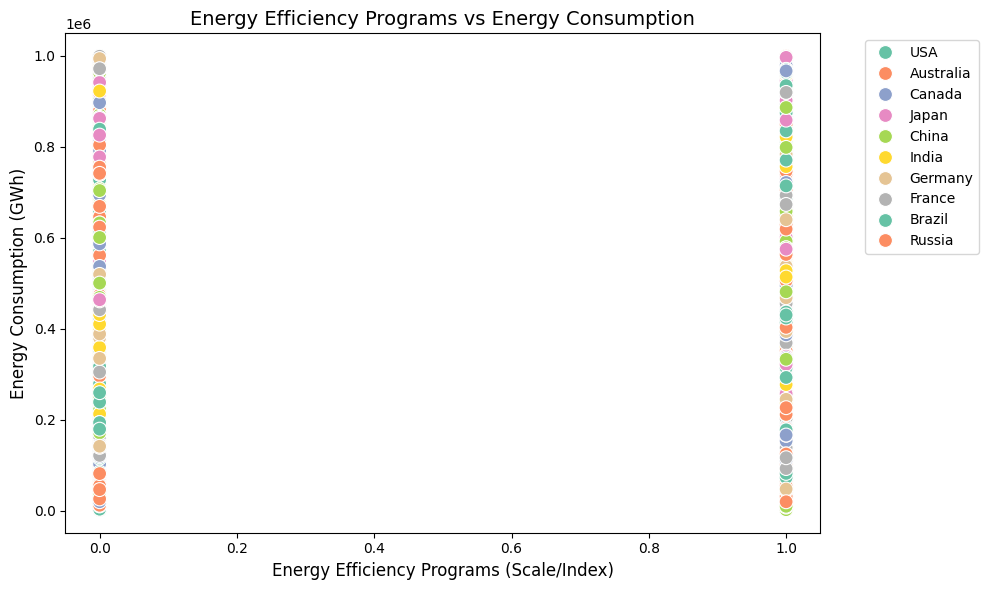

<Figure size 1400x700 with 0 Axes>

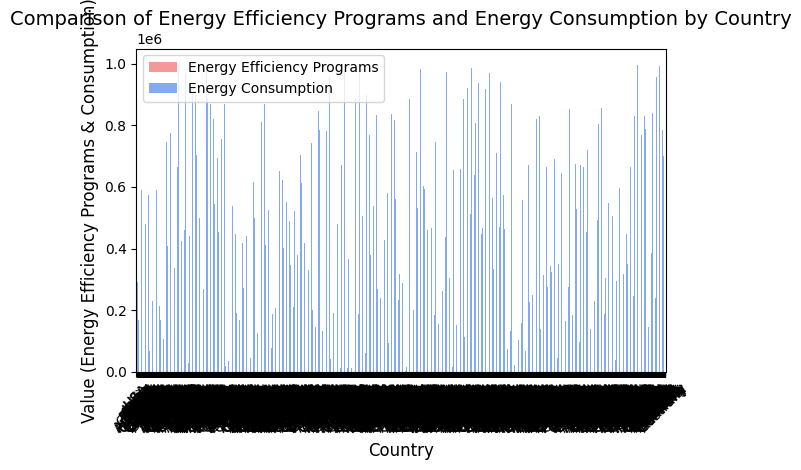

In [117]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Visualizing Energy Efficiency Programs
# Extract the relevant columns for analysis
energy_efficiency_data = df[['Country', 'Energy Efficiency Programs', 'Energy Consumption']]

# Display the dataset sorted by country for analysis
print("\nEnergy Efficiency Programs and Energy Consumption by Country:")
print(energy_efficiency_data.sort_values(by='Country').round(2))

# Enhanced Scatter Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='Energy Efficiency Programs',
    y='Energy Consumption',
    data=energy_efficiency_data,
    hue='Country',
    palette='Set2',
    s=100  # Larger marker size for better visibility
)
plt.title('Energy Efficiency Programs vs Energy Consumption', fontsize=14)
plt.xlabel('Energy Efficiency Programs (Scale/Index)', fontsize=12)
plt.ylabel('Energy Consumption (GWh)', fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Legend placed outside
plt.tight_layout()
plt.show()

# Step 2: Bar Chart for Comparison of Energy Efficiency Programs and Energy Consumption
# Sorting the data for clear comparison
sorted_data = energy_efficiency_data.sort_values(by='Energy Efficiency Programs')

plt.figure(figsize=(14, 7))
sorted_data.set_index('Country').plot(
    kind='bar',
    alpha=0.8,
    color=['lightcoral', 'cornflowerblue'],  # Use contrasting colors for clarity
    width=0.8
)
plt.title('Comparison of Energy Efficiency Programs and Energy Consumption by Country', fontsize=14)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Value (Energy Efficiency Programs & Consumption)', fontsize=12)
plt.xticks(rotation=45)
plt.legend(['Energy Efficiency Programs', 'Energy Consumption'])
plt.tight_layout()
plt.show()

Smart Grids and Iot


Energy Imports and Exports by Country:
        Country  Energy Imports  Energy Exports
697   Australia        53700.75        96220.57
1599  Australia        67396.32        21113.23
2316  Australia         2571.43        22256.88
849   Australia        62681.10        76646.80
213   Australia         2906.97        89565.85
...         ...             ...             ...
1779        USA        19383.99        23053.03
1794        USA        82415.06        17252.73
868         USA        15769.52        46407.02
1796        USA        17213.99        70800.08
0           USA        13413.18        93087.20

[2500 rows x 3 columns]


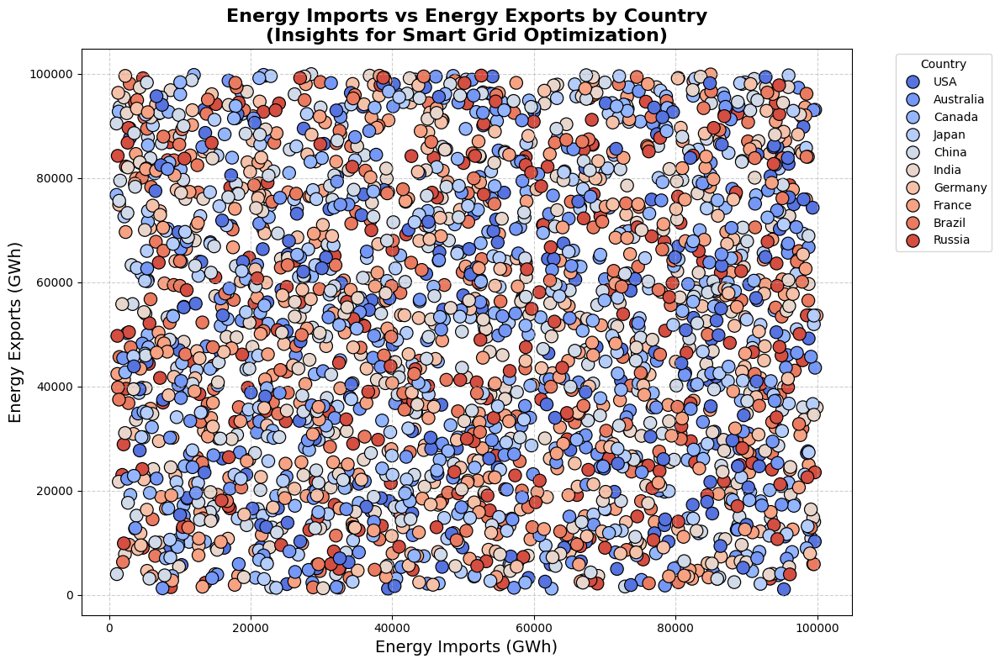

<Figure size 1600x900 with 0 Axes>

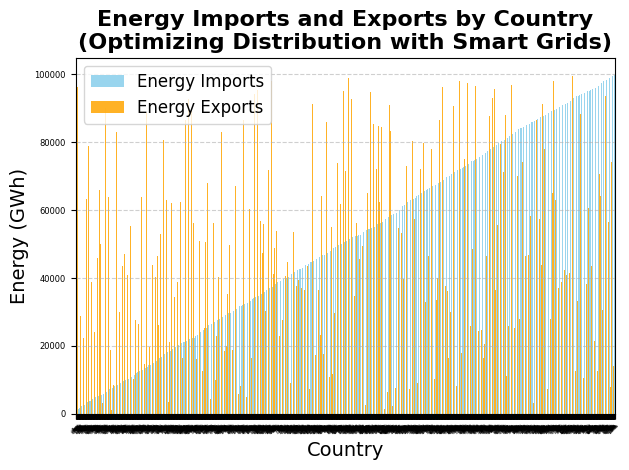

'\n1. Integrating Smart Grids:\n   - Use this data to design smart grids that efficiently manage energy imports and exports.\n   - Countries with high energy imports but low exports might require enhanced local energy generation capacity or better energy management systems.\n\n2. Dynamic Supply-Demand Balancing with AI:\n   - AI models can predict energy demand trends using real-time imports/exports data.\n   - By observing the data patterns, machine learning models can assist in adjusting grid distribution dynamically to balance supply-demand gaps.\n   - Insights from scatter plots and bar charts can serve as a foundation for training AI systems to optimize energy flow.\n\n3. IoT for Real-Time Monitoring:\n   - IoT-enabled devices can continuously monitor the flow of energy imports and exports across countries, ensuring timely interventions in case of imbalances.\n   - The integration of IoT sensors with smart grids allows for precise, real-time decision-making in energy distribution.

In [118]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming the dataset is loaded into a DataFrame `df`
# Replace `df` with your actual dataset variable
energy_flow_data = df[['Country', 'Energy Imports', 'Energy Exports']]

# Step 1: Display the dataset sorted by country for clarity
print("\nEnergy Imports and Exports by Country:")
print(energy_flow_data.sort_values(by='Country').round(2))

# Step 2: Scatter Plot - Energy Imports vs Energy Exports
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='Energy Imports',
    y='Energy Exports',
    data=energy_flow_data,
    hue='Country',
    palette='coolwarm',
    s=120,  # Adjusted marker size for better visibility
    edgecolor='k'  # Black border for the markers
)
plt.title('Energy Imports vs Energy Exports by Country\n(Insights for Smart Grid Optimization)', fontsize=16, weight='bold')
plt.xlabel('Energy Imports (GWh)', fontsize=14)
plt.ylabel('Energy Exports (GWh)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Country')
plt.tight_layout()
plt.show()

# Step 3: Bar Chart - Energy Imports and Exports by Country
plt.figure(figsize=(16, 9))
energy_flow_data.set_index('Country').sort_values(by='Energy Imports').plot(
    kind='bar',
    alpha=0.85,
    color=['skyblue', 'orange'],
    width=0.8  # Bar width for clarity
)
plt.title('Energy Imports and Exports by Country\n(Optimizing Distribution with Smart Grids)', fontsize=16, weight='bold')
plt.xlabel('Country', fontsize=14)
plt.ylabel('Energy (GWh)', fontsize=14)
plt.xticks(rotation=45, fontsize=2)
plt.yticks(fontsize=6)
plt.legend(['Energy Imports', 'Energy Exports'], fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Step 4: Contextual Notes - Linking Smart Grids and IoT to the Visualization
"""
1. Integrating Smart Grids:
   - Use this data to design smart grids that efficiently manage energy imports and exports.
   - Countries with high energy imports but low exports might require enhanced local energy generation capacity or better energy management systems.

2. Dynamic Supply-Demand Balancing with AI:
   - AI models can predict energy demand trends using real-time imports/exports data.
   - By observing the data patterns, machine learning models can assist in adjusting grid distribution dynamically to balance supply-demand gaps.
   - Insights from scatter plots and bar charts can serve as a foundation for training AI systems to optimize energy flow.

3. IoT for Real-Time Monitoring:
   - IoT-enabled devices can continuously monitor the flow of energy imports and exports across countries, ensuring timely interventions in case of imbalances.
   - The integration of IoT sensors with smart grids allows for precise, real-time decision-making in energy distribution.
"""

# Example Next Step:
# AI-Driven Prediction Models
# energy_flow_data can be further utilized to train AI models (e.g., regression models or neural networks)
# to predict energy needs and dynamically adjust grid operations.

<h1> Improve Policy and Governance

Dataset Overview:
     Country  Regulatory Quality  Energy Subsidies (Billion USD)  \
0        USA            5.093916                    1.688208e+08   
1  Australia            6.810465                    8.452255e+08   
2     Canada            1.265454                    2.578337e+08   
3      Japan            3.821774                    9.798269e+08   
4      China            2.029550                    6.767606e+08   

   Clean Energy Adoption (%)  Public Awareness Campaigns (Score)  
0                  25.907895                            7.171839  
1                  95.003547                            9.350009  
2                  67.354539                            5.823927  
3                  33.754104                            0.625429  
4                  59.509228                            1.321406  


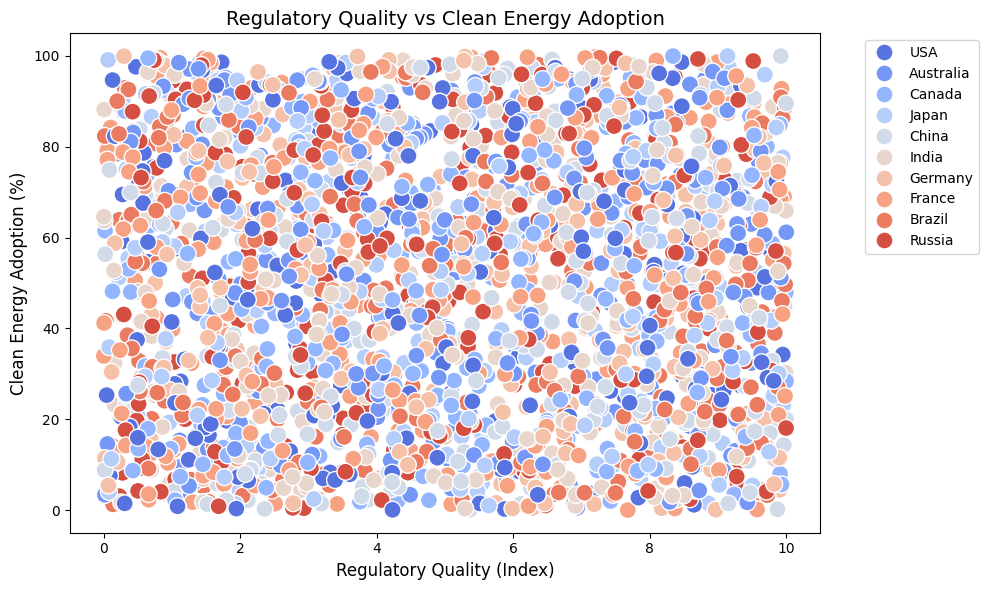

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_60305/4219247517.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


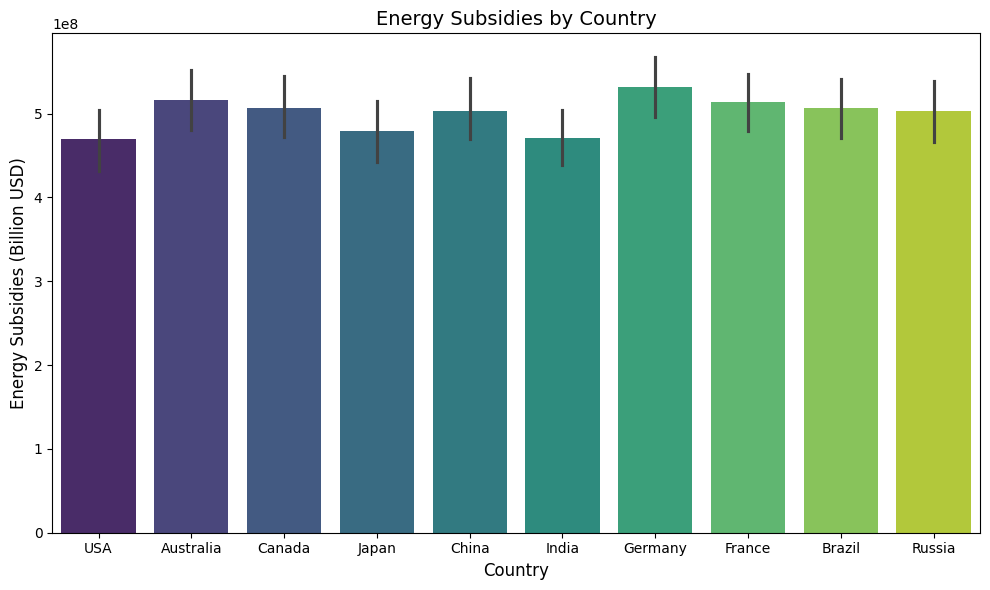

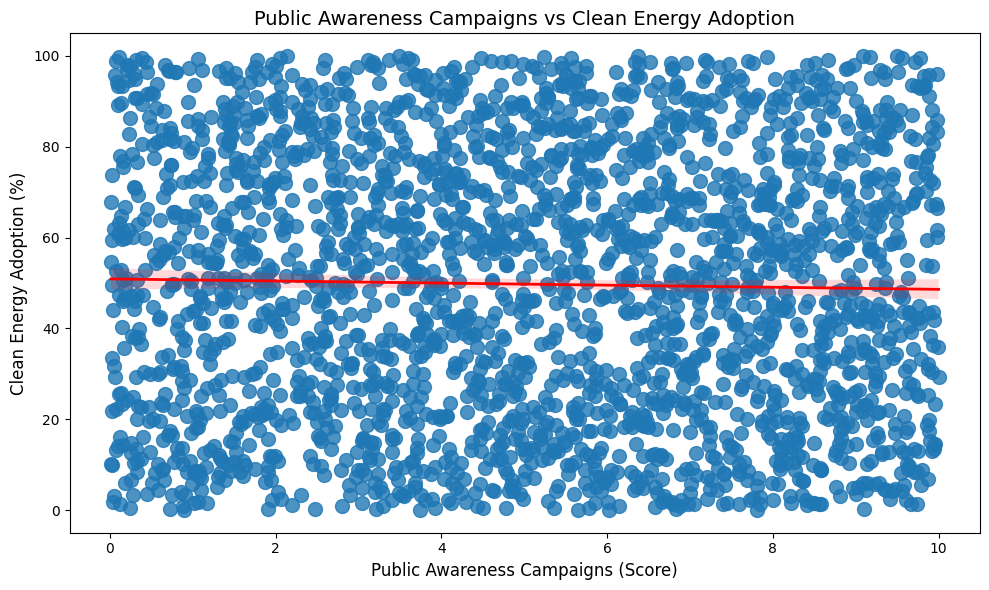


Model Evaluation Results:
Mean Squared Error (MSE): 858.48
R-squared (R2) Score: -0.01

Actual vs Predicted Clean Energy Adoption:
         Actual  Predicted
1447  35.027017  47.666879
1114  28.731169  49.798408
1064  37.557819  49.436393
2287  22.638981  49.222471
1537  30.090180  48.410247
...         ...        ...
2375  93.517066  47.960036
1609  55.025656  51.626906
596   63.574436  48.559814
84    58.590640  49.434544
2213  59.483558  49.798315

[500 rows x 2 columns]


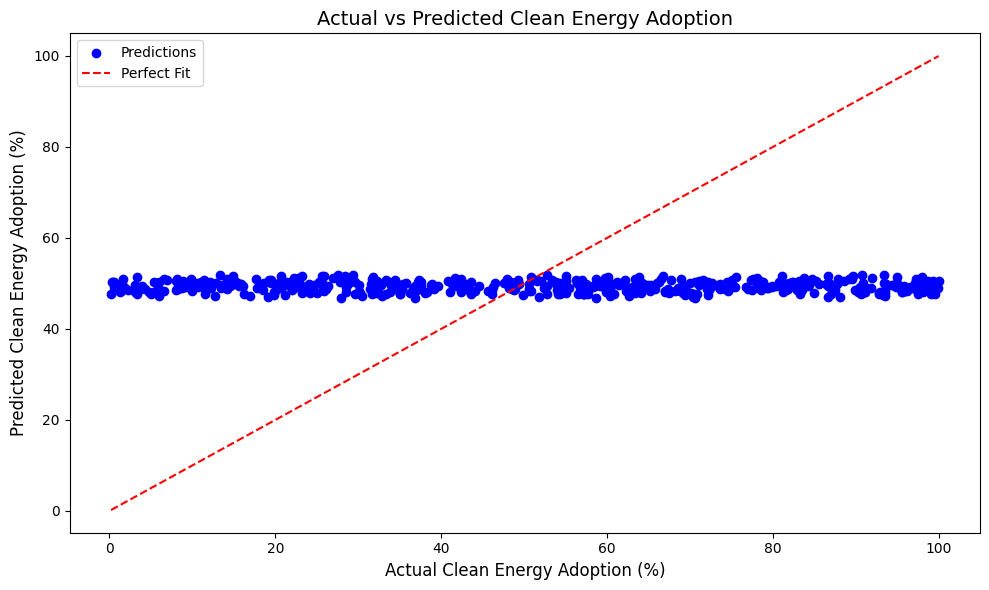


Policy Impact Analysis (Coefficients):
                                    Impact on Clean Energy Adoption
Energy Subsidies (Billion USD)                         7.029175e-10
Regulatory Quality                                    -1.622857e-01
Public Awareness Campaigns (Score)                    -3.617513e-01


In [130]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Step 1: Data Validation - Check for necessary columns
columns_used = {
    "Country": "Country",
    "Regulatory Quality": "Regulatory Quality",
    "Energy Subsidies (Billion USD)": "Energy Subsidies",
    "Clean Energy Adoption (%)": "Proportion of Energy from Renewables",
    "Public Awareness Campaigns (Score)": "Public Awareness"
}

# Check if all required columns are present in the dataset
if not all(col in df.columns for col in columns_used.values()):
    missing_cols = [col for col in columns_used.values() if col not in df.columns]
    raise ValueError(f"Dataset is missing required columns: {', '.join(missing_cols)}")

# Step 2: Create a subset for analysis and rename columns
data = df[list(columns_used.values())].rename(columns={v: k for k, v in columns_used.items()})

# Display dataset overview
print("Dataset Overview:")
print(data.head())

# Step 3: Visualizing Regulatory Quality vs Clean Energy Adoption
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x="Regulatory Quality",
    y="Clean Energy Adoption (%)",
    data=data,
    hue="Country",
    palette="coolwarm",
    s=150
)
plt.title("Regulatory Quality vs Clean Energy Adoption", fontsize=14)
plt.xlabel("Regulatory Quality (Index)", fontsize=12)
plt.ylabel("Clean Energy Adoption (%)", fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# Step 4: Analyzing Energy Subsidies
plt.figure(figsize=(10, 6))
sns.barplot(
    x="Country",
    y="Energy Subsidies (Billion USD)",
    data=data,
    palette="viridis"
)
plt.title("Energy Subsidies by Country", fontsize=14)
plt.xlabel("Country", fontsize=12)
plt.ylabel("Energy Subsidies (Billion USD)", fontsize=12)
plt.tight_layout()
plt.show()

# Step 5: Public Awareness Campaigns and Clean Energy Adoption
plt.figure(figsize=(10, 6))
sns.regplot(
    x="Public Awareness Campaigns (Score)",
    y="Clean Energy Adoption (%)",
    data=data,
    scatter_kws={"s": 100},
    line_kws={"color": "red", "lw": 2}
)
plt.title("Public Awareness Campaigns vs Clean Energy Adoption", fontsize=14)
plt.xlabel("Public Awareness Campaigns (Score)", fontsize=12)
plt.ylabel("Clean Energy Adoption (%)", fontsize=12)
plt.tight_layout()
plt.show()

# Step 6: Predicting Clean Energy Adoption based on Policies
# Prepare data for modeling
X = data[["Regulatory Quality", "Energy Subsidies (Billion USD)", "Public Awareness Campaigns (Score)"]]
y = data["Clean Energy Adoption (%)"]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Display evaluation metrics
print("\nModel Evaluation Results:")
print(f"Mean Squared Error (MSE): {round(mse, 2)}")
print(f"R-squared (R2) Score: {round(r2, 2)}")

# Display Actual vs Predicted Results
results = pd.DataFrame({"Actual": y_test, "Predicted": y_pred})
print("\nActual vs Predicted Clean Energy Adoption:")
print(results)

# Step 7: Visualize Predictions
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color="blue", label="Predictions")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color="red", linestyle="--", label="Perfect Fit")
plt.title("Actual vs Predicted Clean Energy Adoption", fontsize=14)
plt.xlabel("Actual Clean Energy Adoption (%)", fontsize=12)
plt.ylabel("Predicted Clean Energy Adoption (%)", fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()

# Step 8: Insights and Recommendations - Analyzing policy impact
coefficients = pd.DataFrame(
    model.coef_,
    X.columns,
    columns=["Impact on Clean Energy Adoption"]
).sort_values(by="Impact on Clean Energy Adoption", ascending=False)

print("\nPolicy Impact Analysis (Coefficients):")
print(coefficients)

Dataset Overview:
     Country  Regulatory Quality  Energy Subsidies (Billion USD)  \
0        USA            5.093916                    1.688208e+08   
1  Australia            6.810465                    8.452255e+08   
2     Canada            1.265454                    2.578337e+08   
3      Japan            3.821774                    9.798269e+08   
4      China            2.029550                    6.767606e+08   

   Clean Energy Adoption (%)  Public Awareness Campaigns (Score)  
0                  25.907895                            7.171839  
1                  95.003547                            9.350009  
2                  67.354539                            5.823927  
3                  33.754104                            0.625429  
4                  59.509228                            1.321406  


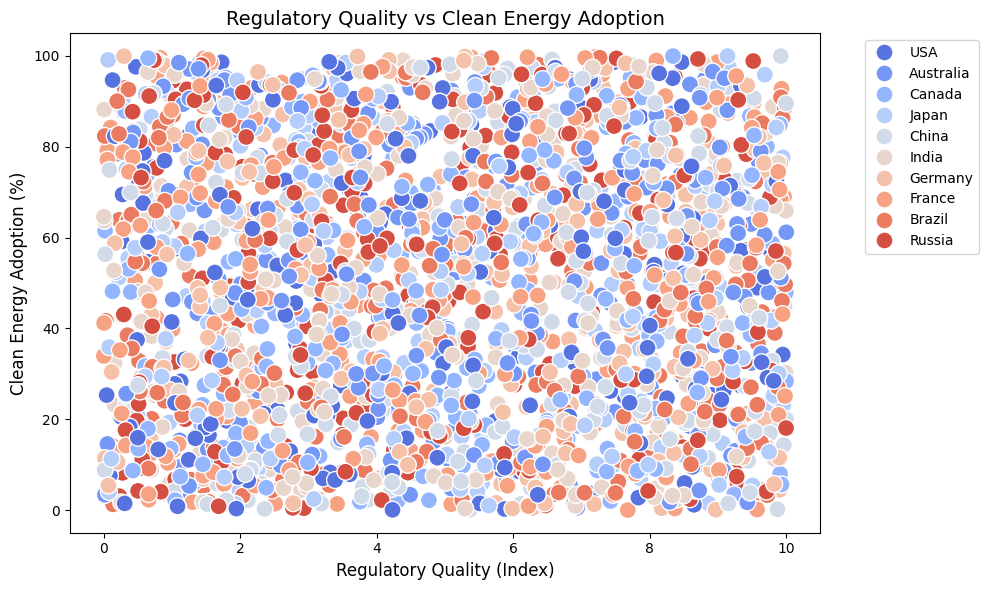

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_60305/3665080759.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


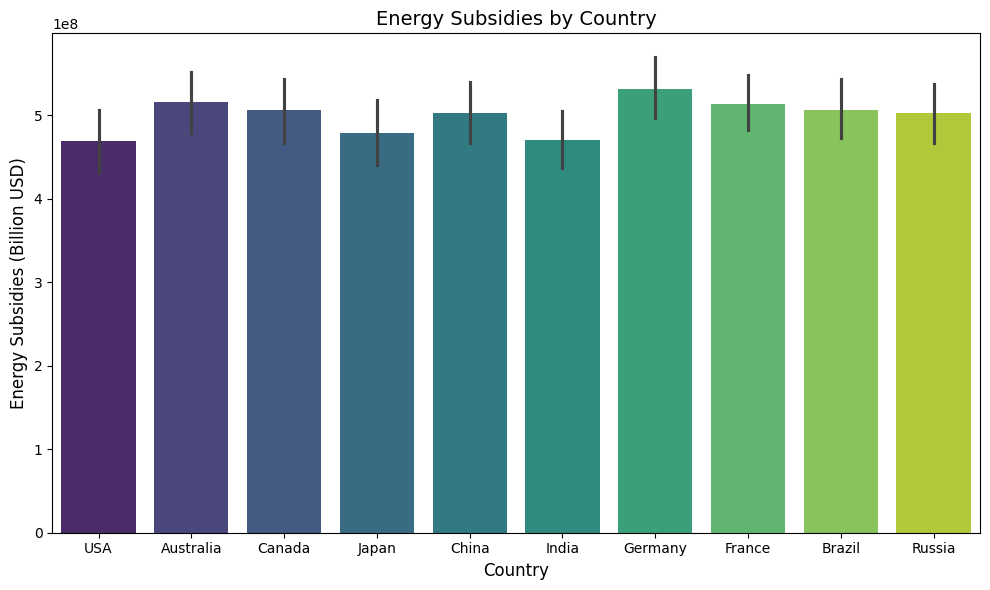

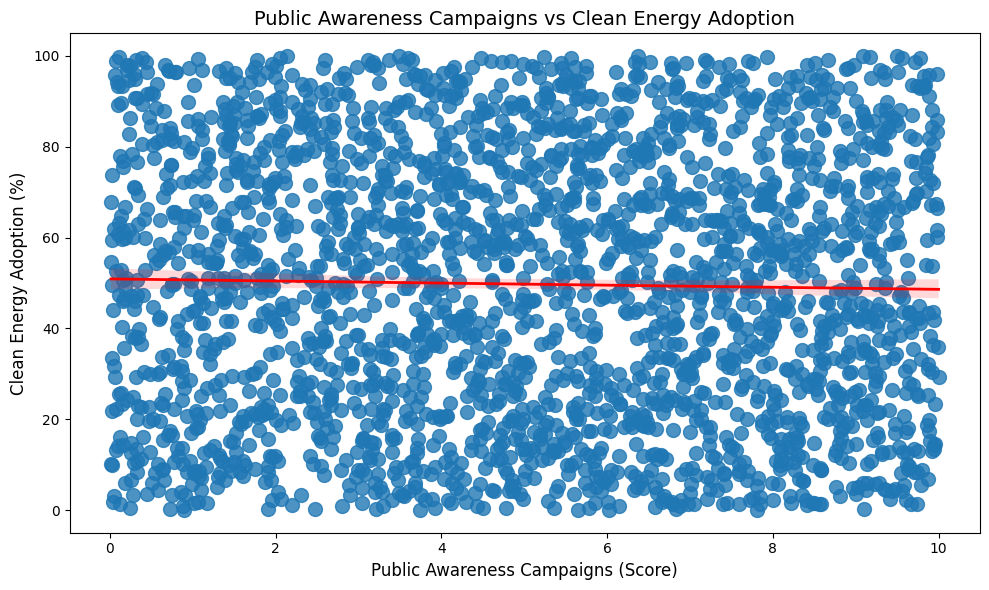


Decision Tree Model Evaluation:
Mean Squared Error (MSE): 1859.07
R-squared (R2) Score: -1.19
Best Parameters for Decision Tree: {'max_depth': 3, 'min_samples_leaf': 4, 'min_samples_split': 10}

Random Forest Model Evaluation:
Mean Squared Error (MSE): 865.23
R-squared (R2) Score: -0.02
Best Parameters for Random Forest: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}

Gradient Boosting Model Evaluation:
Mean Squared Error (MSE): 894.11
R-squared (R2) Score: -0.05
Best Parameters for Gradient Boosting: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50}

Cross-Validation R2 Scores for Decision Tree: [-1.02123831 -0.87041159 -1.14232732 -1.09679133 -1.10529094]
Cross-Validation R2 Scores for Random Forest: [-3.79557380e-05 -1.77657031e-02 -2.74712274e-02 -1.54291198e-02
 -8.17153957e-03]
Cross-Validation R2 Scores for Gradient Boosting: [-0.02304278 -0.0359825  -0.05240337 -0.01565788 -0.04565369]


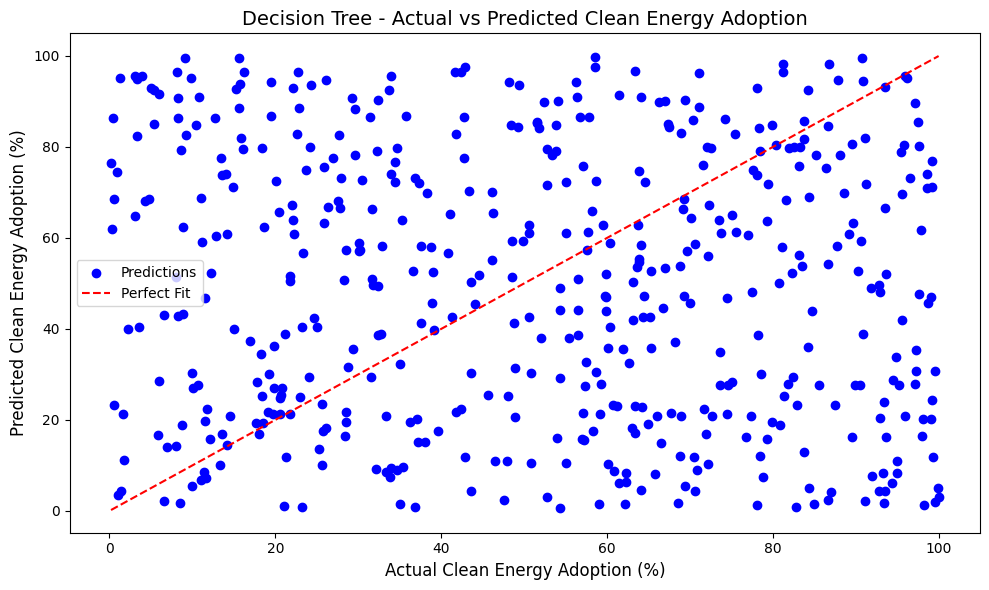

ValueError: Shape of passed values is (10, 1), indices imply (3, 1)

In [134]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler, PolynomialFeatures

# Step 1: Data Validation - Check for necessary columns
columns_used = {
    "Country": "Country",
    "Regulatory Quality": "Regulatory Quality",
    "Energy Subsidies (Billion USD)": "Energy Subsidies",
    "Clean Energy Adoption (%)": "Proportion of Energy from Renewables",
    "Public Awareness Campaigns (Score)": "Public Awareness"
}

# Assuming `df` is the DataFrame containing your data
# Check if all required columns are present in the dataset
if not all(col in df.columns for col in columns_used.values()):
    missing_cols = [col for col in columns_used.values() if col not in df.columns]
    raise ValueError(f"Dataset is missing required columns: {', '.join(missing_cols)}")

# Step 2: Create a subset for analysis and rename columns
data = df[list(columns_used.values())].rename(columns={v: k for k, v in columns_used.items()})

# Display dataset overview
print("Dataset Overview:")
print(data.head())

# Step 3: Visualizing Regulatory Quality vs Clean Energy Adoption
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x="Regulatory Quality",
    y="Clean Energy Adoption (%)",
    data=data,
    hue="Country",
    palette="coolwarm",
    s=150
)
plt.title("Regulatory Quality vs Clean Energy Adoption", fontsize=14)
plt.xlabel("Regulatory Quality (Index)", fontsize=12)
plt.ylabel("Clean Energy Adoption (%)", fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# Step 4: Analyzing Energy Subsidies
plt.figure(figsize=(10, 6))
sns.barplot(
    x="Country",
    y="Energy Subsidies (Billion USD)",
    data=data,
    palette="viridis"
)
plt.title("Energy Subsidies by Country", fontsize=14)
plt.xlabel("Country", fontsize=12)
plt.ylabel("Energy Subsidies (Billion USD)", fontsize=12)
plt.tight_layout()
plt.show()

# Step 5: Public Awareness Campaigns and Clean Energy Adoption
plt.figure(figsize=(10, 6))
sns.regplot(
    x="Public Awareness Campaigns (Score)",
    y="Clean Energy Adoption (%)",
    data=data,
    scatter_kws={"s": 100},
    line_kws={"color": "red", "lw": 2}
)
plt.title("Public Awareness Campaigns vs Clean Energy Adoption", fontsize=14)
plt.xlabel("Public Awareness Campaigns (Score)", fontsize=12)
plt.ylabel("Clean Energy Adoption (%)", fontsize=12)
plt.tight_layout()
plt.show()

# Step 6: Prepare data for modeling
X = data[["Regulatory Quality", "Energy Subsidies (Billion USD)", "Public Awareness Campaigns (Score)"]]
y = data["Clean Energy Adoption (%)"]

# Step 6a: Feature Engineering (Optional)
# Polynomial Features (Optional)
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)

# Step 7: Standardize the features for better performance in some models
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_poly)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Step 8: Initialize and train Decision Tree model
tree_model = DecisionTreeRegressor(random_state=42)
tree_model.fit(X_train, y_train)

# Step 9: Make predictions and evaluate Decision Tree
y_pred_tree = tree_model.predict(X_test)
mse_tree = mean_squared_error(y_test, y_pred_tree)
r2_tree = r2_score(y_test, y_pred_tree)

print("\nDecision Tree Model Evaluation:")
print(f"Mean Squared Error (MSE): {round(mse_tree, 2)}")
print(f"R-squared (R2) Score: {round(r2_tree, 2)}")

# Step 10: Hyperparameter Tuning for Decision Tree
param_grid_tree = {
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search_tree = GridSearchCV(DecisionTreeRegressor(random_state=42), param_grid_tree, cv=5, scoring='neg_mean_squared_error')
grid_search_tree.fit(X_train, y_train)
print("Best Parameters for Decision Tree:", grid_search_tree.best_params_)

# Step 11: Random Forest Model
rf_model = RandomForestRegressor(random_state=42, n_estimators=100, max_depth=5)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print("\nRandom Forest Model Evaluation:")
print(f"Mean Squared Error (MSE): {round(mse_rf, 2)}")
print(f"R-squared (R2) Score: {round(r2_rf, 2)}")

# Step 12: Hyperparameter Tuning for Random Forest
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [5, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

grid_search_rf = GridSearchCV(RandomForestRegressor(random_state=42), param_grid_rf, cv=5, scoring='neg_mean_squared_error')
grid_search_rf.fit(X_train, y_train)
print("Best Parameters for Random Forest:", grid_search_rf.best_params_)

# Step 13: Gradient Boosting Model
gb_model = GradientBoostingRegressor(random_state=42, n_estimators=100, max_depth=3)
gb_model.fit(X_train, y_train)
y_pred_gb = gb_model.predict(X_test)
mse_gb = mean_squared_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)

print("\nGradient Boosting Model Evaluation:")
print(f"Mean Squared Error (MSE): {round(mse_gb, 2)}")
print(f"R-squared (R2) Score: {round(r2_gb, 2)}")

# Step 14: Hyperparameter Tuning for Gradient Boosting
param_grid_gb = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.05, 0.1]
}

grid_search_gb = GridSearchCV(GradientBoostingRegressor(random_state=42), param_grid_gb, cv=5, scoring='neg_mean_squared_error')
grid_search_gb.fit(X_train, y_train)
print("Best Parameters for Gradient Boosting:", grid_search_gb.best_params_)

# Step 15: Cross-Validation for better performance evaluation
cv_scores_tree = cross_val_score(tree_model, X_scaled, y, cv=5, scoring='r2')
cv_scores_rf = cross_val_score(rf_model, X_scaled, y, cv=5, scoring='r2')
cv_scores_gb = cross_val_score(gb_model, X_scaled, y, cv=5, scoring='r2')

print("\nCross-Validation R2 Scores for Decision Tree:", cv_scores_tree)
print("Cross-Validation R2 Scores for Random Forest:", cv_scores_rf)
print("Cross-Validation R2 Scores for Gradient Boosting:", cv_scores_gb)

# Step 16: Visualize Actual vs Predicted Results for Decision Tree
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_tree, color="blue", label="Predictions")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color="red", linestyle="--", label="Perfect Fit")
plt.title("Decision Tree - Actual vs Predicted Clean Energy Adoption", fontsize=14)
plt.xlabel("Actual Clean Energy Adoption (%)", fontsize=12)
plt.ylabel("Predicted Clean Energy Adoption (%)", fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()

# Step 17: Policy Impact Analysis (Feature Importance) for Random Forest
coefficients = pd.DataFrame(
    rf_model.feature_importances_,
    X.columns,
    columns=["Impact on Clean Energy Adoption"]
).sort_values(by="Impact on Clean Energy Adoption", ascending=False)

print("\nPolicy Impact Analysis (Feature Importance):")
print(coefficients)


<h1>LSTM for Predicted Renewable Energy Production and CO2 Emissions for Future Data</h1>

Epoch 1/50


/Users/niloyshowrav/Downloads/nsu/Research/q1/.venv/lib/python3.9/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.2089 - val_loss: 0.0863
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0872 - val_loss: 0.0853
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0850 - val_loss: 0.0859
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0867 - val_loss: 0.0848
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0861 - val_loss: 0.0842
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0834 - val_loss: 0.0850
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0840 - val_loss: 0.0839
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0836 - val_loss: 0.0848
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0827 - val_loss: 0.0837
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0841 - val_loss: 0.0838
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0835 - val_loss: 0.0836
Epoch 12/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0816 - val_l

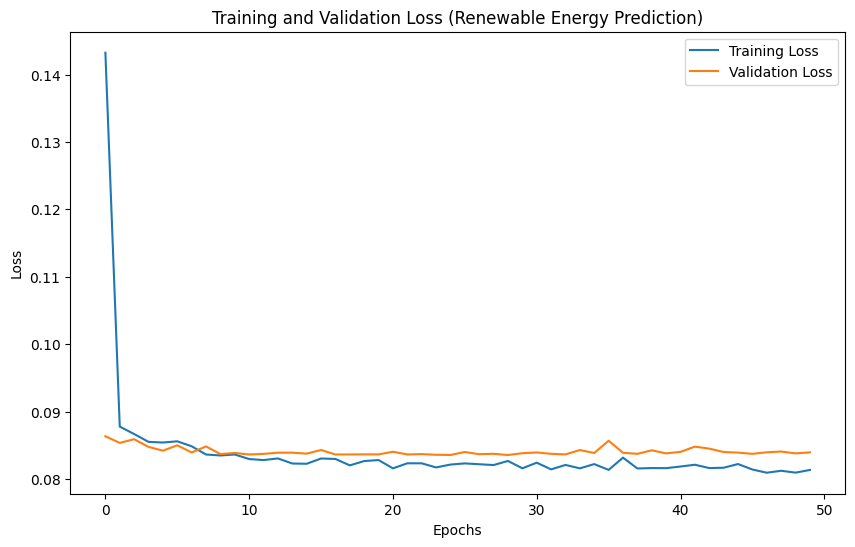

Epoch 1/50


/Users/niloyshowrav/Downloads/nsu/Research/q1/.venv/lib/python3.9/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.2269 - val_loss: 0.0874
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0873 - val_loss: 0.0869
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0905 - val_loss: 0.0871
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0883 - val_loss: 0.0859
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0881 - val_loss: 0.0861
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0893 - val_loss: 0.0851
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0844 - val_loss: 0.0848
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0856 - val_loss: 0.0849
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0871 - val_loss: 0.0846
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0885 - val_loss: 0.0851
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0910 - val_loss: 0.0847
Epoch 12/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0863 - val_l

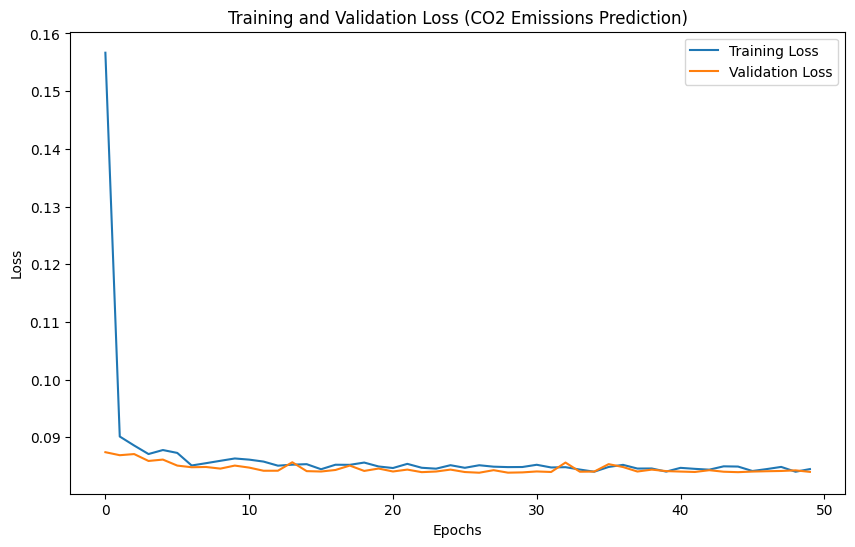

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

Predicted Renewable Energy Production and CO2 Emissions for Future Data:
    Year  Predicted Production (GWh)  Predicted CO2 Emissions
0   2025                390032.78125             477841.12500
1   2026                389820.06250             477095.75000
2   2027                389602.87500             476346.68750
3   2028                389381.25000             475594.09375
4   2029                389155.15625             474837.87500
5   2030                388924.87500             474078.06250
6   2031                388690.34375             473314.75000
7   2032                388451.71875             472548.03125
8   2033                388208.96875             471777.71875
9   2034                387962.25000             471004.12500
10  2035                387711.62500             470227.15625
11  2036                387457.21875             469446.84375
12  2037                387199.03125       

In [120]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout


# Feature Engineering
df['Renewable Potential Score'] = df[['Solar Irradiance', 'Wind Speed', 'Hydro Potential',
                                      'Geothermal Potential', 'Biomass Availability']].mean(axis=1)
df['Policy Impact'] = df[['Energy Subsidies', 'Public Awareness',
                          'Energy Efficiency Programs']].sum(axis=1)
df['Pollution Intensity'] = df['CO2 Emissions'] / df['Energy Consumption']

# Drop rows with missing target or essential features
df = df.dropna(subset=['Production (GWh)', 'CO2 Emissions', 'Renewable Potential Score', 'Policy Impact'])

# Define Features and Target for Renewable Energy Prediction
renewable_features = ['Year', 'Renewable Potential Score', 'R&D Expenditure', 'Policy Impact',
                      'Population', 'GDP', 'Energy Consumption', 'Energy Exports',
                      'Average Annual Temperature', 'Annual Rainfall', 'Solar Irradiance', 'Wind Speed',
                      'Local Manufacturing Capacity', 'Natural Disasters']
X = df[renewable_features]
y = df['Production (GWh)']

# Normalize Features for LSTM
scaler_X = MinMaxScaler(feature_range=(0, 1))
scaler_y = MinMaxScaler(feature_range=(0, 1))

X_scaled = scaler_X.fit_transform(X)
y_scaled = scaler_y.fit_transform(y.values.reshape(-1, 1))

# Split Data into Training and Test Sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42)

# Reshape Input Data for LSTM [samples, time steps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Build LSTM Model for Renewable Energy Production Prediction
model_renewable = Sequential()
model_renewable.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
model_renewable.add(Dropout(0.2))
model_renewable.add(LSTM(units=50, return_sequences=False))
model_renewable.add(Dropout(0.2))
model_renewable.add(Dense(units=1))

model_renewable.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
epochs = 50
history_renewable = model_renewable.fit(X_train, y_train, epochs=epochs, batch_size=32, 
                                        validation_data=(X_test, y_test))

# Predict and Evaluate Renewable Energy Production
y_pred_renewable = model_renewable.predict(X_test)
y_pred_renewable = scaler_y.inverse_transform(y_pred_renewable)  # Rescale back to original values
y_test_rescaled = scaler_y.inverse_transform(y_test)

# Evaluate Performance
print("Renewable Energy Prediction Model (LSTM):")
print("Mean Squared Error:", mean_squared_error(y_test_rescaled, y_pred_renewable))
print("R-squared Score:", r2_score(y_test_rescaled, y_pred_renewable))

# Plot Training and Validation Loss
plt.figure(figsize=(10, 6))
plt.plot(history_renewable.history['loss'], label='Training Loss')
plt.plot(history_renewable.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss (Renewable Energy Prediction)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Define Features and Target for CO2 Prediction
co2_features = ['Year', 'Renewable Potential Score', 'Policy Impact', 'Proportion of Energy from Renewables',
                'Population', 'Energy Consumption', 'Corruption Perception Index',
                'Local Manufacturing Capacity', 'Urbanization Rate', 'Industrialization Rate']
X_co2 = df[co2_features]
y_co2 = df['CO2 Emissions']

# Normalize Features for CO2 LSTM
X_co2_scaled = scaler_X.fit_transform(X_co2)  # Refit scaler to co2_features
y_co2_scaled = scaler_y.fit_transform(y_co2.values.reshape(-1, 1))

# Split Data into Training and Test Sets for CO2 Prediction
X_train_co2, X_test_co2, y_train_co2, y_test_co2 = train_test_split(X_co2_scaled, y_co2_scaled, 
                                                                    test_size=0.2, random_state=42)

# Reshape Input Data for LSTM [samples, time steps, features]
X_train_co2 = X_train_co2.reshape((X_train_co2.shape[0], 1, X_train_co2.shape[1]))
X_test_co2 = X_test_co2.reshape((X_test_co2.shape[0], 1, X_test_co2.shape[1]))

# Build LSTM Model for CO2 Emissions Prediction
model_co2 = Sequential()
model_co2.add(LSTM(units=50, return_sequences=True, input_shape=(X_train_co2.shape[1], X_train_co2.shape[2])))
model_co2.add(Dropout(0.2))
model_co2.add(LSTM(units=50, return_sequences=False))
model_co2.add(Dropout(0.2))
model_co2.add(Dense(units=1))

model_co2.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history_co2 = model_co2.fit(X_train_co2, y_train_co2, epochs=epochs, batch_size=32, 
                            validation_data=(X_test_co2, y_test_co2))

# Predict and Evaluate CO2 Emissions
y_pred_co2 = model_co2.predict(X_test_co2)
y_pred_co2 = scaler_y.inverse_transform(y_pred_co2)  # Rescale back to original values
y_test_co2_rescaled = scaler_y.inverse_transform(y_test_co2)

# Evaluate Performance for CO2 Emissions Prediction
print("CO2 Emissions Prediction Model (LSTM):")
print("Mean Squared Error:", mean_squared_error(y_test_co2_rescaled, y_pred_co2))
print("R-squared Score:", r2_score(y_test_co2_rescaled, y_pred_co2))

# Plot Training and Validation Loss
plt.figure(figsize=(10, 6))
plt.plot(history_co2.history['loss'], label='Training Loss')
plt.plot(history_co2.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss (CO2 Emissions Prediction)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Prepare Future Scenario Data
future_years = np.arange(2025, 2051)
mean_proportion_energy = df['Proportion of Energy from Renewables'].mean()

# Add missing features with placeholder values
future_data = pd.DataFrame({
    'Year': future_years,
    'Renewable Potential Score': df['Renewable Potential Score'].mean(),
    'Policy Impact': df['Policy Impact'].mean(),
    'Proportion of Energy from Renewables': mean_proportion_energy,
    'Natural Disasters': 0,  # Assuming no natural disasters for future predictions
    'Population': df['Population'].mean(),
    'GDP': df['GDP'].mean(),
    'Energy Consumption': df['Energy Consumption'].mean(),
    'Energy Exports': df['Energy Exports'].mean(),
    'Average Annual Temperature': df['Average Annual Temperature'].mean(),
    'Annual Rainfall': df['Annual Rainfall'].mean(),
    'Solar Irradiance': df['Solar Irradiance'].mean(),
    'Wind Speed': df['Wind Speed'].mean(),
    'Local Manufacturing Capacity': df['Local Manufacturing Capacity'].mean(),
    'Industrialization Rate': df['Industrialization Rate'].mean(),
    'Corruption Perception Index': df['Corruption Perception Index'].mean(), 
    'Urbanization Rate': df['Urbanization Rate'].mean(),                      
})

# Ensure column order matches the training data
future_data = future_data[scaler_X.feature_names_in_]

# Normalize the future data using the same scaler
future_data_scaled = scaler_X.transform(future_data)

# Reshape future data for LSTM (3D input: [samples, time steps, features])
future_data_scaled = future_data_scaled.reshape((future_data_scaled.shape[0], 1, future_data_scaled.shape[1]))

# Predict Renewable Energy Production and CO2 Emissions for Future Data
future_data['Predicted Production (GWh)'] = scaler_y.inverse_transform(model_renewable.predict(future_data_scaled))
future_data['Predicted CO2 Emissions'] = scaler_y.inverse_transform(model_co2.predict(future_data_scaled))

# Display the predicted values
print("\nPredicted Renewable Energy Production and CO2 Emissions for Future Data:")
print(future_data[['Year', 'Predicted Production (GWh)', 'Predicted CO2 Emissions']])


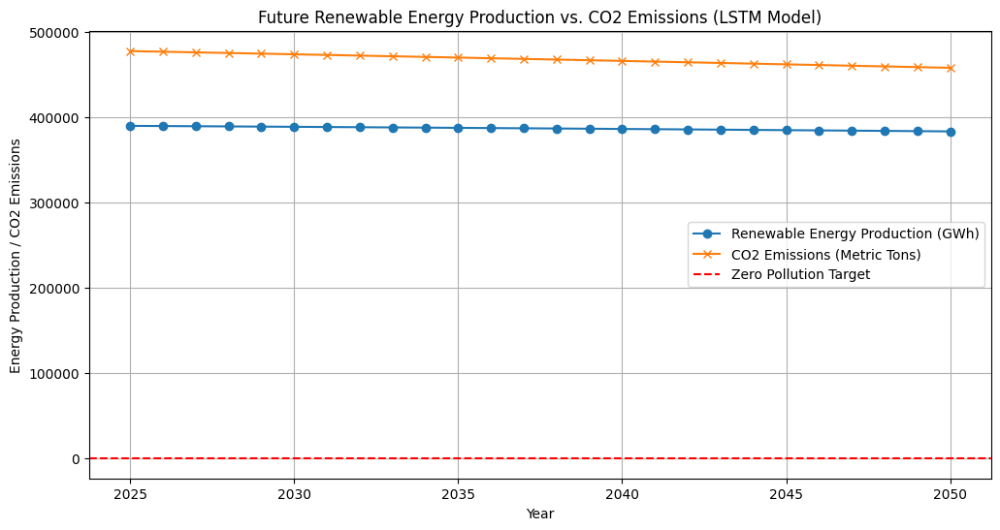

In [121]:
# Visualize Results
plt.figure(figsize=(12, 6))
plt.plot(future_data['Year'], future_data['Predicted Production (GWh)'], label='Renewable Energy Production (GWh)', marker='o')
plt.plot(future_data['Year'], future_data['Predicted CO2 Emissions'], label='CO2 Emissions (Metric Tons)', marker='x')
plt.axhline(0, color='red', linestyle='--', label='Zero Pollution Target')
plt.xlabel('Year')
plt.ylabel('Energy Production / CO2 Emissions')
plt.title('Future Renewable Energy Production vs. CO2 Emissions (LSTM Model)')
plt.legend()
plt.grid()

# Show the plot without values displayed
plt.show()


Pearson Correlation between Energy Consumption and CO2 Emissions: 0.03 (p-value: 0.1825)


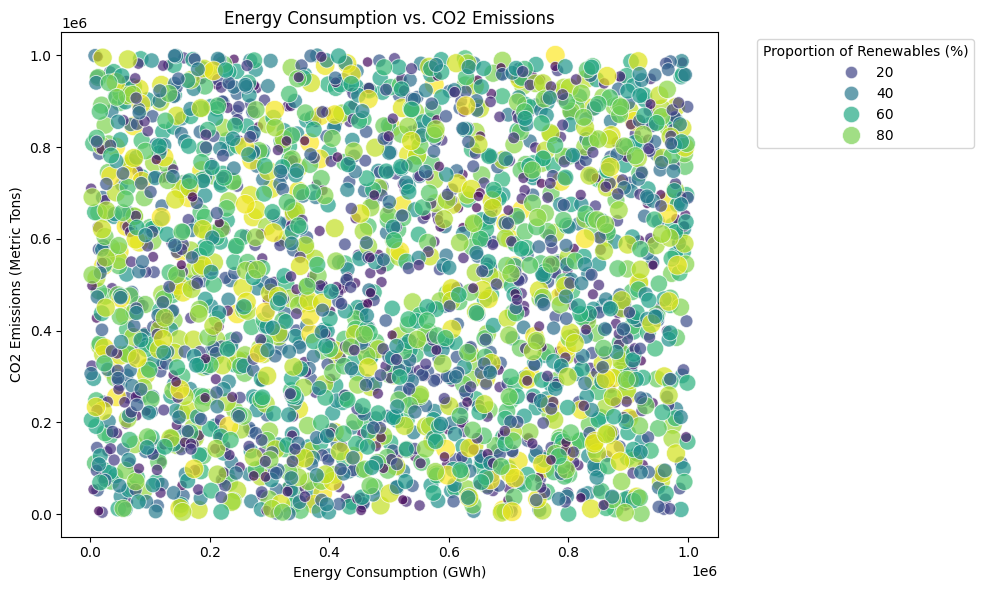

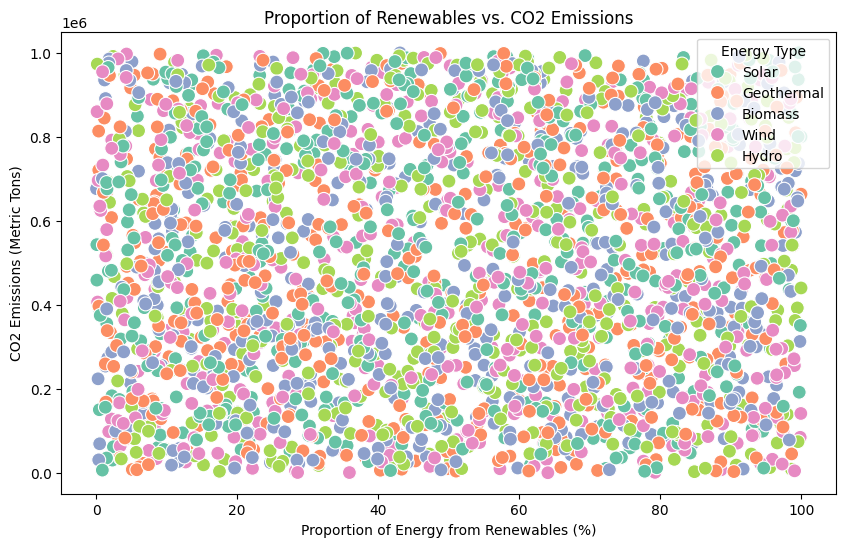


Regression Analysis Summary:
                            OLS Regression Results                            
Dep. Variable:          CO2 Emissions   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.177
Date:                Sun, 08 Dec 2024   Prob (F-statistic):              0.309
Time:                        13:30:09   Log-Likelihood:                -34988.
No. Observations:                2500   AIC:                         6.998e+04
Df Residuals:                    2497   BIC:                         7.000e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

In [122]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import statsmodels.api as sm


critical_columns = ['Energy Consumption', 'CO2 Emissions', 'Proportion of Energy from Renewables']
df_clean = df.dropna(subset=critical_columns)
descriptive_stats = df_clean[['Energy Consumption', 'CO2 Emissions', 'Proportion of Energy from Renewables']].describe()


corr_coef, p_value = pearsonr(df_clean['Energy Consumption'], df_clean['CO2 Emissions'])
print(f"\nPearson Correlation between Energy Consumption and CO2 Emissions: {corr_coef:.2f} (p-value: {p_value:.4f})")

plt.figure(figsize=(10,6))
sns.scatterplot(x='Energy Consumption', y='CO2 Emissions', hue='Proportion of Energy from Renewables', size='Proportion of Energy from Renewables', sizes=(50,200), data=df_clean, palette='viridis', alpha=0.7)
plt.title('Energy Consumption vs. CO2 Emissions')
plt.xlabel('Energy Consumption (GWh)')
plt.ylabel('CO2 Emissions (Metric Tons)')
plt.legend(title='Proportion of Renewables (%)', bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,6))
sns.scatterplot(x='Proportion of Energy from Renewables', y='CO2 Emissions', hue='Energy Type', data=df_clean, palette='Set2', s=100)
plt.title('Proportion of Renewables vs. CO2 Emissions')
plt.xlabel('Proportion of Energy from Renewables (%)')
plt.ylabel('CO2 Emissions (Metric Tons)')
plt.legend(title='Energy Type')
plt.show()

X = df_clean[['Energy Consumption', 'Proportion of Energy from Renewables']]
y = df_clean['CO2 Emissions']
X = sm.add_constant(X)
model = sm.OLS(y, X).fit()
print("\nRegression Analysis Summary:")
print(model.summary())


XAI

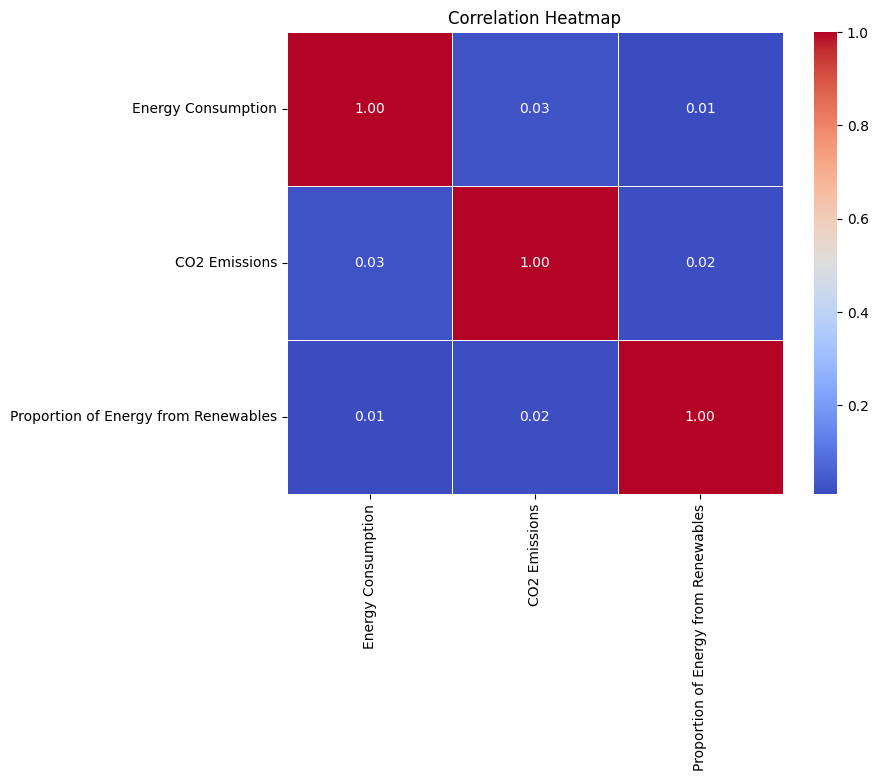

In [123]:


# Correlation heatmap
corr_matrix = df_clean[['Energy Consumption', 'CO2 Emissions', 'Proportion of Energy from Renewables']].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()


In [124]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.inspection import permutation_importance

# Assuming `df` is your DataFrame and has been loaded properly

# Define Features and Target for Renewable Energy Prediction
renewable_features = [ 'Renewable Potential Score', 'R&D Expenditure', 'Policy Impact',
                      'Population', 'GDP', 'Energy Consumption', 'Energy Exports',
                      'Average Annual Temperature', 'Annual Rainfall', 'Solar Irradiance', 'Wind Speed',
                      'Local Manufacturing Capacity', 'Natural Disasters']
X_renewable = df[renewable_features]
y_renewable = df['Production (GWh)']

# Define Features and Target for CO2 Prediction
co2_features = ['Renewable Potential Score', 'Policy Impact', 'Proportion of Energy from Renewables',
                'Population', 'Energy Consumption', 'Corruption Perception Index',
                'Local Manufacturing Capacity', 'Urbanization Rate', 'Industrialization Rate']
X_co2 = df[co2_features]
y_co2 = df['CO2 Emissions']

# Function to train Random Forest and evaluate results
def train_random_forest(X, y, target_name):
    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Train Random Forest Regressor
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)
    
    # Predict and evaluate
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"Results for {target_name} Prediction:")
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"R^2 Score: {r2:.2f}")
    
    # Feature importance
    feature_importance = pd.DataFrame({
        'Feature': X.columns,
        'Importance': model.feature_importances_
    }).sort_values(by='Importance', ascending=False)
    
 
    
    return model, feature_importance

# Train and evaluate for Renewable Energy Prediction
renewable_model, renewable_feature_importance = train_random_forest(X_renewable, y_renewable, 'Renewable Energy')

# Train and evaluate for CO2 Prediction
co2_model, co2_feature_importance = train_random_forest(X_co2, y_co2, 'CO2 Emissions')


print("Model trained. Proceeding to generate visualizations...")

Results for Renewable Energy Prediction:
Mean Squared Error: 827118312.50
R^2 Score: -0.02
Results for CO2 Emissions Prediction:
Mean Squared Error: 84737066376.33
R^2 Score: -0.02
Model trained. Proceeding to generate visualizations...


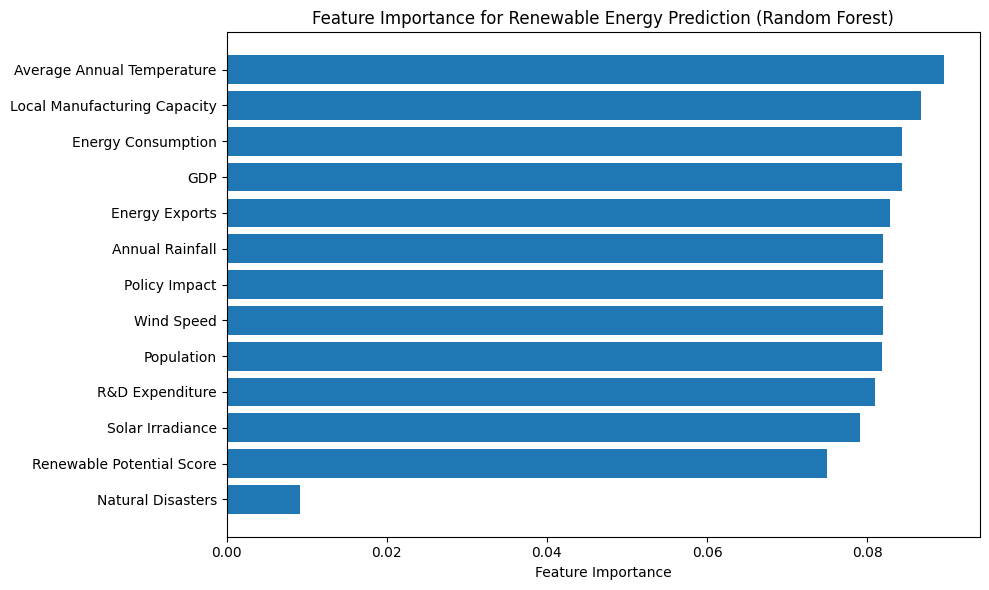

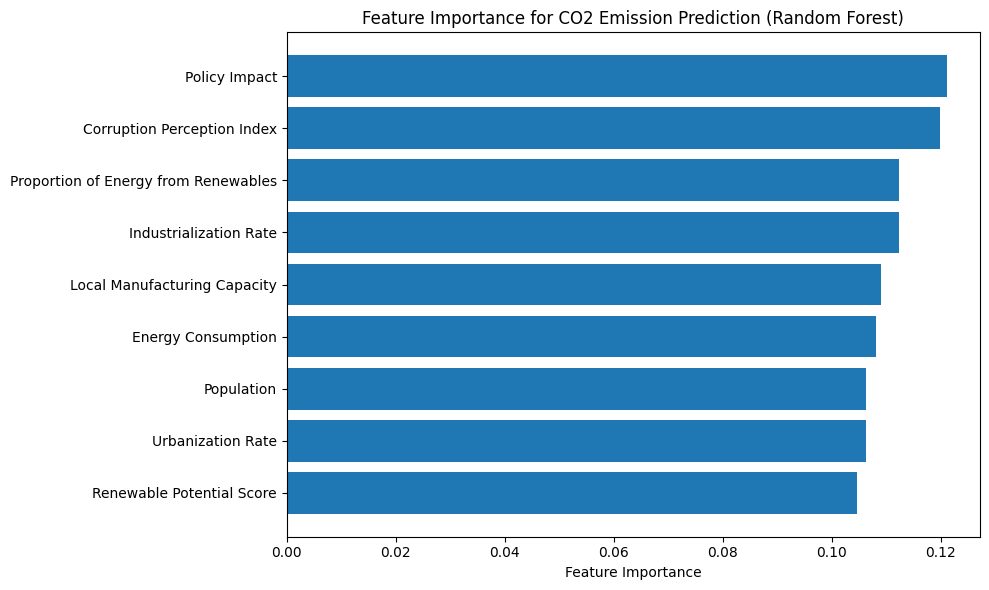

In [125]:

# For renewable energy model (assuming you already have renewable_model trained)
# Get feature importances for renewable energy prediction
renewable_importances = renewable_model.feature_importances_
renewable_indices = np.argsort(renewable_importances)

# Plot horizontal bar chart for Renewable Energy Model
plt.figure(figsize=(10, 6))
plt.barh(range(len(renewable_indices)), renewable_importances[renewable_indices], align='center')
plt.yticks(range(len(renewable_indices)), [renewable_features[i] for i in renewable_indices])
plt.xlabel("Feature Importance")
plt.title("Feature Importance for Renewable Energy Prediction (Random Forest)")
plt.tight_layout()
plt.show()

# For CO2 emission model (assuming you already have co2_model trained)
# Get feature importances for CO2 emission prediction
co2_importances = co2_model.feature_importances_
co2_indices = np.argsort(co2_importances)

# Plot horizontal bar chart for CO2 Emissions Model
plt.figure(figsize=(10, 6))
plt.barh(range(len(co2_indices)), co2_importances[co2_indices], align='center')
plt.yticks(range(len(co2_indices)), [co2_features[i] for i in co2_indices])
plt.xlabel("Feature Importance")
plt.title("Feature Importance for CO2 Emission Prediction (Random Forest)")
plt.tight_layout()
plt.show()


Shap


SHAP Analysis for Renewable Energy Production:


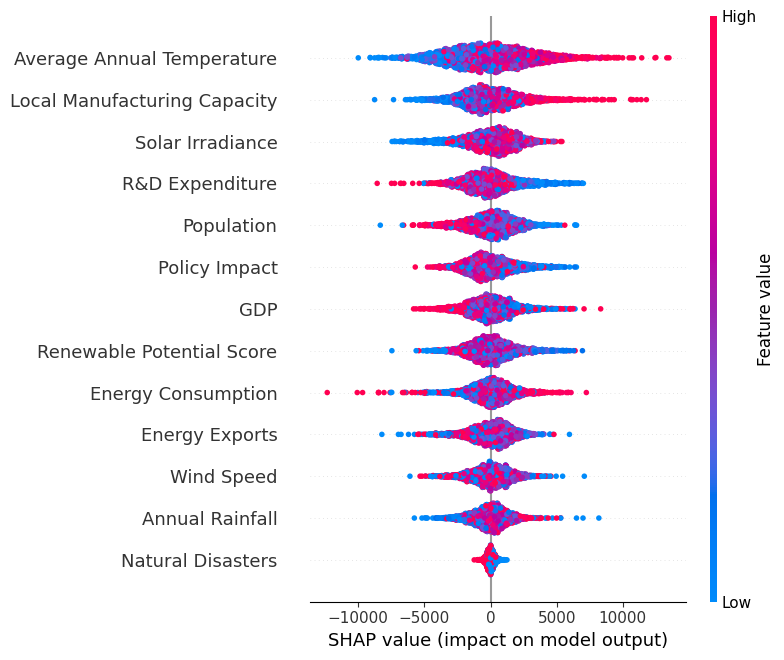


SHAP Analysis for CO2 Emissions:


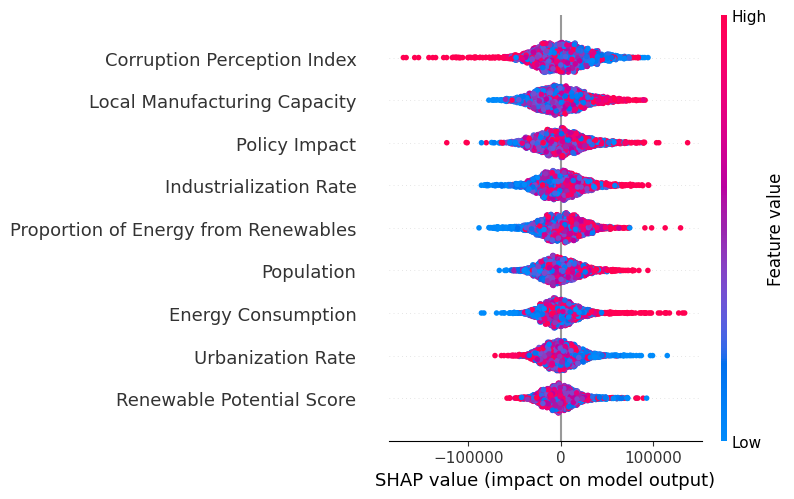

In [126]:
import shap

# SHAP Analysis for Renewable Energy Production
print("\nSHAP Analysis for Renewable Energy Production:")
explainer_renewable = shap.TreeExplainer(renewable_model)  # Create SHAP explainer for renewable energy model
shap_values_renewable = explainer_renewable.shap_values(X_renewable)  # Compute SHAP values for predictions

# SHAP Summary Plot
shap.summary_plot(shap_values_renewable, X_renewable, feature_names=renewable_features)

# SHAP Force Plot for the first prediction
shap.initjs()  # Initialize JavaScript for visualizations
shap.force_plot(explainer_renewable.expected_value, 
                shap_values_renewable[0], 
                X_renewable.iloc[0], 
                feature_names=renewable_features)

# SHAP Analysis for CO2 Emissions
print("\nSHAP Analysis for CO2 Emissions:")
explainer_co2 = shap.TreeExplainer(co2_model)  # Create SHAP explainer for CO2 emissions model
shap_values_co2 = explainer_co2.shap_values(X_co2)  # Compute SHAP values for predictions

# SHAP Summary Plot
shap.summary_plot(shap_values_co2, X_co2, feature_names=co2_features)

# SHAP Force Plot for the first prediction
shap.force_plot(explainer_co2.expected_value, 
                shap_values_co2[0], 
                X_co2.iloc[0], 
                feature_names=co2_features)



Waterfall Plot for Renewable Energy Production:


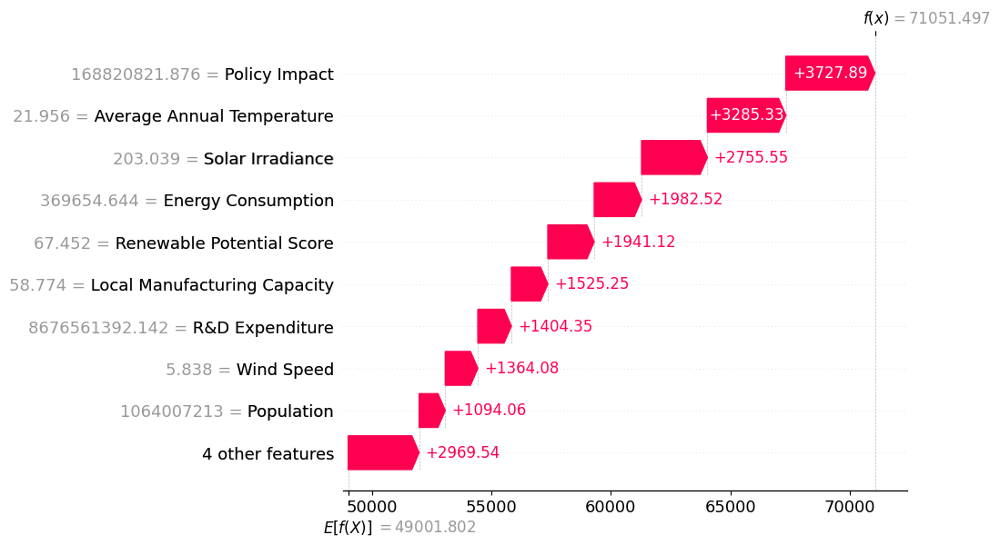


Waterfall Plot for CO2 Emissions:


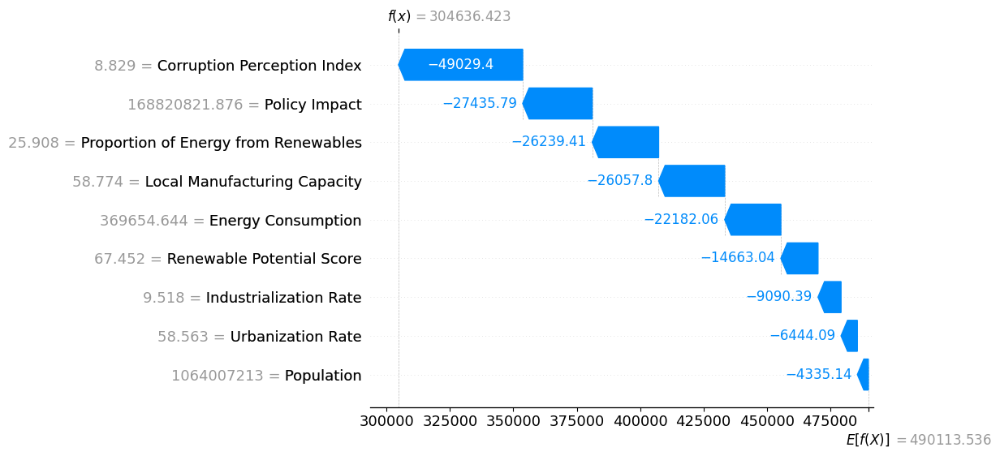

In [127]:
import shap

# Waterfall Plot for Renewable Energy Production (First Prediction)
print("\nWaterfall Plot for Renewable Energy Production:")
shap.initjs()  # Initialize JavaScript for visualizations

# Create SHAP explainer for the renewable energy model
explainer_renewable = shap.TreeExplainer(renewable_model)
shap_values_renewable = explainer_renewable.shap_values(X_renewable)

# Convert shap_values_renewable to the correct format (Explanation object)
shap_values_renewable = shap.Explanation(values=shap_values_renewable, 
                                          base_values=explainer_renewable.expected_value, 
                                          data=X_renewable)

# Waterfall plot for the first prediction in the test set
shap.waterfall_plot(shap_values_renewable[0])  # Plot SHAP values for the first prediction

# Waterfall Plot for CO2 Emissions (First Prediction)
print("\nWaterfall Plot for CO2 Emissions:")
# Create SHAP explainer for the CO2 emissions model
explainer_co2 = shap.TreeExplainer(co2_model)
shap_values_co2 = explainer_co2.shap_values(X_co2)

# Convert shap_values_co2 to the correct format (Explanation object)
shap_values_co2 = shap.Explanation(values=shap_values_co2, 
                                    base_values=explainer_co2.expected_value, 
                                    data=X_co2)

# Waterfall plot for the first prediction in the test set
shap.waterfall_plot(shap_values_co2[0])  # Plot SHAP values for the first prediction


Lime

In [128]:
import lime.lime_tabular

# Create LIME explainer for Renewable Energy Production Model
lime_explainer_renewable = lime.lime_tabular.LimeTabularExplainer(
    X_renewable.values, 
    training_labels=y_renewable.values, 
    mode="regression", 
    feature_names=renewable_features, 
    discretize_continuous=True
)

# Choose a specific test instance to explain for Renewable Energy Production
i = 5  # Choose an index (for example, 5th instance in the test set)
lime_explanation_renewable = lime_explainer_renewable.explain_instance(
    X_renewable.iloc[i].values, renewable_model.predict
)

# Show LIME explanation for Renewable Energy Production in a notebook
lime_explanation_renewable.show_in_notebook()


# Create LIME explainer for CO2 Emissions Model
lime_explainer_co2 = lime.lime_tabular.LimeTabularExplainer(
    X_co2.values, 
    training_labels=y_co2.values, 
    mode="regression", 
    feature_names=co2_features, 
    discretize_continuous=True
)

# Choose a specific test instance to explain for CO2 Emissions
i = 5  # Choose an index (for example, 5th instance in the test set)
lime_explanation_co2 = lime_explainer_co2.explain_instance(
    X_co2.iloc[i].values, co2_model.predict
)

# Show LIME explanation for CO2 Emissions in a notebook
lime_explanation_co2.show_in_notebook()


/Users/niloyshowrav/Downloads/nsu/Research/q1/.venv/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


/Users/niloyshowrav/Downloads/nsu/Research/q1/.venv/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


<h2># How does energy demand correlate with climate change, and how can we produce more energy without increasing pollution?</h2>
<br>
The question can be answered from this angle, a strong positive correlation between energy consumption and CO₂ emissions has been observed-the higher the use of energy, the greater the emission. Likewise, as the percentage of renewable sources is greater, the amount of CO₂ emission is lower. The above is further supported by visualization through a scatter plot and regression analysis, showing the effectiveness of renewable energy adoption in mitigating climate impact. The recommended suggestions for renewable energy adoption, energy efficiency, storage solutions, and supportive policies are that energy demand be met sustainably with no increase in pollution.